In [832]:
import os
import rasterio
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import matplotlib.colors as colors
from scipy.stats import binned_statistic

import seaborn as sns

import rioxarray as rxr
import xarray
import pandas as pd

from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from matplotlib import colors

%matplotlib inline

# new Stuff


In [80]:
data_directory = "//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_data/SM_hcc_outputs/"

## Load in datasets

In [3]:
basins = rasterio.open(os.path.join(data_directory, 'hcc_AllBasins.tif'))
basins_read = basins.read(1, masked=True)

dinf = rasterio.open(os.path.join(data_directory, 'seward_hsp_acc_int.tif'))
dinf_read = dinf.read(1, masked=True)

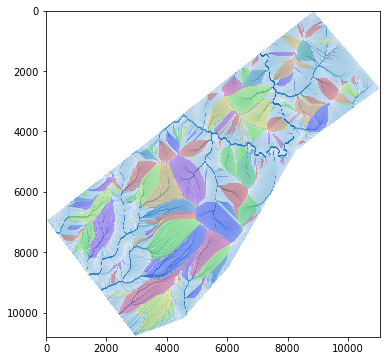

In [4]:
fig, ax = plt.subplots(figsize=(6,6))

im0 = ax.imshow(dinf_read, 
           norm=colors.LogNorm(vmin=1, vmax=dinf_read.max()), cmap='Blues', zorder=1)
im1 = ax.imshow(basins_read, zorder=2, alpha=0.3, cmap='prism')

plt.show()

In [5]:
curv = rasterio.open(os.path.join(data_directory, 'curv_LW.tif'))
curv_read = curv.read(1, masked=True)

disp = rasterio.open(os.path.join(data_directory, 'seward_hsp_insar.tif'))
disp_read = disp.read(1, masked=True)

asp = rasterio.open(os.path.join(data_directory, 'seward_hsp_aspect.tif'))
asp_read = asp.read(1, masked=True)


In [6]:
dinf.crs

CRS.from_epsg(32603)

In [7]:
#disp2 = rasterio.open(os.path.join(data_directory, 'stacked_velocity.tif'))

#disp2_read = disp2.read(1, masked=True)

In [10]:
import numpy as np
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.crs import CRS

dst_crs = 'EPSG:32603'
#dst_crs = dinf.crs

src = rasterio.open(os.path.join(data_directory, 'stacked_velocity.tif'))
transform, width, height = calculate_default_transform(
    src.crs, dst_crs, src.width, src.height, *src.bounds)
kwargs = src.meta.copy()
kwargs.update({
    'crs': dst_crs,
    'transform': transform,
    'width': width,
    'height': height
})
#with rasterio.open('mosaic.tif') as src:
#     transform, width, height = calculate_default_transform(
#         src.crs, dst_crs, src.width, src.height, *src.bounds)
#     kwargs = src.meta.copy()
#     kwargs.update({
#         'crs': dst_crs,
#         'transform': transform,
#         'width': width,
#         'height': height
#     })


dest, transform = reproject(
        source=src.read(1),
#         destination=rasterio.band(dst, 1),
        src_transform=src.transform,
        src_crs=src.crs,
#         dst_transform=transform,
        dst_crs=dst_crs,
        resampling=Resampling.bilinear)
        
       
with rasterio.open('stacked_velocity_epsg32603.tif', 'w', **kwargs) as dst:
    dst.write(dest)       

src.close()

In [6]:
disp = rasterio.open(os.path.join(data_directory, 'velocity_arc_repro_clip.tif'))
disp_read = disp.read(1, masked=True)


In [7]:
elev = rasterio.open(os.path.join(data_directory, 'seward_hsp_elev.tif'))
elev_read = elev.read(1, masked=True)

In [8]:
slope = rasterio.open(os.path.join(data_directory, 'seward_hsp_slope.tif'))
slope_read = slope.read(1, masked=True)

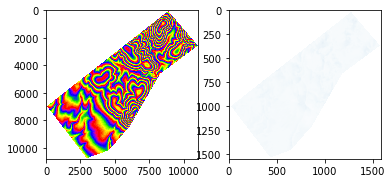

In [30]:
fig, ax = plt.subplots(1,2, figsize=(6,6))

im1 = ax[0].imshow(elev_read, zorder=1, cmap='prism')
im0 = ax[1].imshow(disp_read, 
           cmap='Blues', zorder=2, alpha=0.1)


plt.show()

In [91]:
disp_read.max()

0.09636193743914524

### Define stacK

In [9]:
stack = [elev, slope, dinf, curv, asp, disp]
stack_names = ["Elev", "Slope", "Dinf", "Curv", "Asp", "Disp"]

### Turn integer "splitter" raster into labeled coordinates

In [10]:
rds = rxr.open_rasterio(
    (os.path.join(data_directory, 'hcc_AllBasins.tif')),
)
rds = rds.squeeze().drop("spatial_ref").drop("band")
rds.name = "junct" #the basin raster is written with the outlet_junction from the AllBasins.csv
df = rds.to_dataframe().reset_index()

#You could check if you want
#outlets = sorted(pd.unique(df.basin))
#print(outlets)


#Eliminate data points where the basin raster did not have a basin
df=df[df.junct>=0.0] 

#Convert them to integers 
df.junct = df.junct.astype(int)

df


#https://gis.stackexchange.com/questions/384581/raster-to-geopandas

,y,x,junct
3937172,7.220838e+06,445252.273593,230
3948240,7.220836e+06,445254.273593,230
3959308,7.220834e+06,445256.273593,230
3970375,7.220832e+06,445256.273593,230
3970376,7.220832e+06,445258.273593,230
...,...,...,...
118707538,7.200096e+06,434270.273593,24371
118718604,7.200094e+06,434268.273593,24371
118729670,7.200092e+06,434266.273593,24371
118740736,7.200090e+06,434264.273593,24371


### Sample raster stack by splitter raster

In [11]:
coords = [(x,y) for x, y in zip(df.x, df.y)]

# sample data from rasters
for i, raster_file in enumerate(stack):
    # Sample the raster at every point location and store values in DataFrame
    col = stack_names[i]
    df[col] = [x[0] for x in raster_file.sample(coords)]
    raster_file.close()


In [12]:
df.to_csv('basin_raster_sample_3.csv')

### group by basin (junction here)

In [41]:
grouped = df.groupby(['junct']).median().reset_index()

In [42]:
outlet = df.groupby(['junct']).min().reset_index()
outlet = outlet['Elev']

In [43]:
grouped['Outlet Elev']=outlet

In [44]:
grouped

,junct,y,x,Elev,Slope,Dinf,Curv,Asp,Disp,Outlet Elev
0,125,7.220320e+06,446064.273593,258.991455,0.145415,414.877319,-0.000268,40.505646,0.009415,126.747734
1,178,7.220186e+06,445236.273593,301.815369,0.177447,565.558350,0.000019,337.530334,0.002360,186.561066
2,227,7.220178e+06,445378.273593,308.101562,0.162957,367.010284,-0.000146,337.460052,0.003334,183.019302
3,230,7.220452e+06,445450.273593,261.537323,0.174203,436.334656,-0.000042,341.388428,0.008668,178.662659
4,242,7.220212e+06,446270.273593,253.235138,0.159765,607.347778,-0.000179,58.646072,0.019859,98.579834
...,...,...,...,...,...,...,...,...,...,...
236,24640,7.201708e+06,435358.273593,84.308365,0.024837,200.755188,-0.000006,216.031342,0.003863,35.356762
237,24709,7.201498e+06,436738.273593,98.290039,0.018653,98.018974,-0.000011,201.991058,0.004901,79.534470
238,24802,7.201208e+06,434506.273593,65.305412,0.027294,134.081360,-0.000010,225.136627,0.005129,34.739712
239,24804,7.201426e+06,434158.273593,62.534744,0.031178,117.209671,-0.000035,238.536179,0.001858,35.480118


In [47]:
df2 = pd.read_csv(os.path.join(data_directory, 'hcc_AllBasinsInfo.csv'))
merge = pd.concat([grouped, df2],axis=1, join="inner")
merge

,junct,y,x,Elev,Slope,Dinf,Curv,Asp,Disp,Outlet Elev,latitude,longitude,outlet_latitude,outlet_longitude,outlet_junction,basin_key
0,125,7.220320e+06,446064.273593,258.991455,0.145415,414.877319,-0.000268,40.505646,0.009415,126.747734,65.101249,-166.146578,65.106238,-166.132526,125,0
1,178,7.220186e+06,445236.273593,301.815369,0.177447,565.558350,0.000019,337.530334,0.002360,186.561066,65.100764,-166.165249,65.105460,-166.168307,178,1
2,227,7.220178e+06,445378.273593,308.101562,0.162957,367.010284,-0.000146,337.460052,0.003334,183.019302,65.100898,-166.164105,65.104484,-166.166859,227,2
3,230,7.220452e+06,445450.273593,261.537323,0.174203,436.334656,-0.000042,341.388428,0.008668,178.662659,65.101197,-166.162585,65.106293,-166.165065,230,3
4,242,7.220212e+06,446270.273593,253.235138,0.159765,607.347778,-0.000179,58.646072,0.019859,98.579834,65.100132,-166.142485,65.103826,-166.128591,242,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,24640,7.201708e+06,435358.273593,84.308365,0.024837,200.755188,-0.000006,216.031342,0.003863,35.356762,64.930238,-166.370224,64.920464,-166.386855,24640,236
237,24709,7.201498e+06,436738.273593,98.290039,0.018653,98.018974,-0.000011,201.991058,0.004901,79.534470,64.932164,-166.340070,64.924856,-166.346304,24709,237
238,24802,7.201208e+06,434506.273593,65.305412,0.027294,134.081360,-0.000010,225.136627,0.005129,34.739712,64.929176,-166.386120,64.923555,-166.398012,24802,238
239,24804,7.201426e+06,434158.273593,62.534744,0.031178,117.209671,-0.000035,238.536179,0.001858,35.480118,64.929878,-166.393603,64.927455,-166.401303,24804,239


## Assign orientation to basins and plot displacement by aspect

In [48]:
import pandas as pd
import numpy as np

In [49]:
#Clean
df.loc[df.Asp < 0.0, 'Asp'] = np.nan

In [50]:
## This is for LSDTT basin delineation output. Change if you're not using that to another list of basins IDs
junction_id_list = pd.unique(df.junct)

# Bin raw aspect measurements into 8 cardinal directions
df['asp_card'] = pd.cut(df.Asp, [0.0, 33.75, 78.75, 101.25, 146.25, 191.25, 236.25, 281.25, 326.25, 360.0],
                    labels=["N", "NE", "E", "SE","S", "SW", "W", "NW", "N"],
                    ordered=False)

# First, group the data by junction ID, then by cardinal direction. 
# Then count how many instances of each direction exists for each basin, and then sort asceding. 
# Group and sort by junction again and then take the top three (tail(3))
#At the end, reset the index because this is hard. 

df_ranked = df.groupby(['junct','asp_card']).count().sort_values(by='Asp').groupby(level='junct',as_index=False).tail(3).sort_values(by='junct')
df2 = df_ranked.reset_index()

# Once you've grouped by junctions, take the first, second and third most common aspects and save them for each basin

basin_aspect = pd.DataFrame()

for i in range(df2.groupby('junct').ngroups):
    first = df2[df2['junct']==junction_id_list[i]]['asp_card'].reset_index().loc[2][1]
    second = df2[df2['junct']==junction_id_list[i]]['asp_card'].reset_index().loc[1][1]
    third = df2[df2['junct']==junction_id_list[i]]['asp_card'].reset_index().loc[0][1]
    nr = [{"junct": junction_id_list[i], "First": first, "Second": second, "Third": third}]
    new_row = pd.DataFrame(nr)
    basin_aspect=basin_aspect.append(new_row)

In [51]:
basin_aspect

,junct,First,Second,Third
0,230,NE,N,NW
0,125,E,NE,N
0,227,NE,NW,N
0,178,NE,NW,N
0,242,SE,NE,E
...,...,...,...,...
0,24709,S,SW,W
0,24595,W,SW,NW
0,24815,W,S,SW
0,24802,S,SW,W


In [52]:
#Clean displacement data for where there was nodata 

df.loc[df.Disp < disp_read.min(), 'Disp'] = np.nan

df['Disp'].min()

-0.041433588

In [59]:
grouped = merge.groupby(['junct']).mean().reset_index()
grouped2 = pd.merge(grouped, basin_aspect, on='junct')
grouped2.head()

,junct,y,x,Elev,Slope,Dinf,Curv,Asp,Disp,Outlet Elev,latitude,longitude,outlet_latitude,outlet_longitude,outlet_junction,basin_key,First,Second,Third
0,125,7.220320e+06,446064.273593,258.991455,0.145415,414.877319,-0.000268,40.505646,0.009415,126.747734,65.101249,-166.146578,65.106238,-166.132526,125.0,0.0,E,NE,N
1,178,7.220186e+06,445236.273593,301.815369,0.177447,565.558350,0.000019,337.530334,0.002360,186.561066,65.100764,-166.165249,65.105460,-166.168307,178.0,1.0,NE,NW,N
2,227,7.220178e+06,445378.273593,308.101562,0.162957,367.010284,-0.000146,337.460052,0.003334,183.019302,65.100898,-166.164105,65.104484,-166.166859,227.0,2.0,NE,NW,N
3,230,7.220452e+06,445450.273593,261.537323,0.174203,436.334656,-0.000042,341.388428,0.008668,178.662659,65.101197,-166.162585,65.106293,-166.165065,230.0,3.0,NE,N,NW
4,242,7.220212e+06,446270.273593,253.235138,0.159765,607.347778,-0.000179,58.646072,0.019859,98.579834,65.100132,-166.142485,65.103826,-166.128591,242.0,4.0,SE,NE,E


Text(0.5, 0, 'Most common aspect of pixels in watershed')

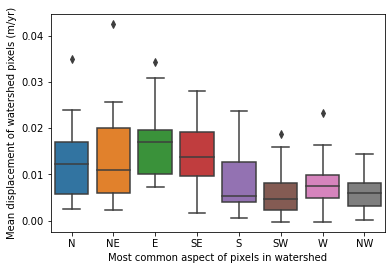

In [60]:
cardinal_order = ["N", "NE", "E", "SE","S", "SW", "W", "NW"]

fig, ax = plt.subplots()
ax = sns.boxplot(x='First', y='Disp', data=grouped2, order=cardinal_order)
ax.set_ylabel('Mean displacement of watershed pixels (m/yr)')
ax.set_xlabel('Most common aspect of pixels in watershed')

Text(0.5, 0, 'Outlet elevation (m asl)')

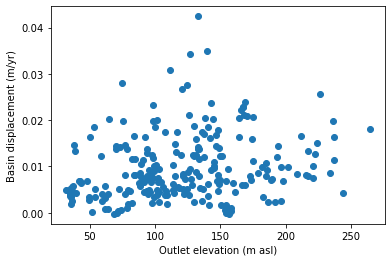

In [63]:
plt.scatter(grouped2['Outlet Elev'], grouped2['Disp'])
plt.ylabel("Basin displacement (m/yr)")
plt.xlabel("Outlet elevation (m asl)")

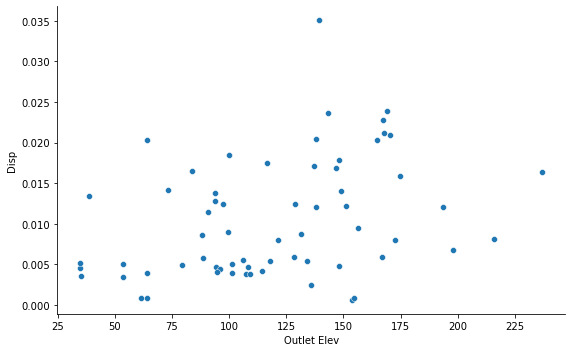

In [74]:
sns.relplot(data=grouped2[(grouped2['First'] == 'N') | (grouped2['First'] == 'S')], x='Outlet Elev', y='Disp', aspect=1.61, zorder=1)
plt.show()

## still to do: map and color code basins by displacement

In [171]:
grouped.to_csv("basin_mean_stats.csv")

## Add Sentinel-2 derived metrics

In [81]:
rds = rxr.open_rasterio(
    (os.path.join(data_directory, 'hcc_AllBasins.tif')),
)
rds = rds.squeeze().drop("spatial_ref").drop("band")
rds.name = "junct" #the basin raster is written with the outlet_junction from the AllBasins.csv
df = rds.to_dataframe().reset_index()

#You could check if you want
#outlets = sorted(pd.unique(df.basin))
#print(outlets)


#Eliminate data points where the basin raster did not have a basin
df=df[df.junct>=0.0] 

#Convert them to integers 
df.junct = df.junct.astype(int)


coords = [(x,y) for x, y in zip(df.x, df.y)]



### define and sample S2 stack

In [82]:
stack = ["moisture_std.tif", "wetness_std.tif", "ndvi_std.tif", "ndvi_Aug_June.tif", "ndvi_max.tif"]
stack_names = ["NDMI std", "NDWI std", "NDVI std", "NDVI seasonal", "NDVI max"]

# sample data from rasters
for i, raster_file in enumerate(stack):
    # Sample the raster at every point location and store values in DataFrame
    src = rasterio.open((os.path.join(data_directory, raster_file)))
    col = stack_names[i]
    print(col)
    df[col] = [x[0] for x in src.sample(coords)]
    src.close()


NDMI std
NDWI std
NDVI std
NDVI seasonal
NDVI max


In [83]:
df.to_csv('basin_raster_sample_S2.csv')

### define and sample PlanetScope stack

In [86]:
rds = rxr.open_rasterio(
    (os.path.join(data_directory, 'hcc_AllBasins.tif')),
)
rds = rds.squeeze().drop("spatial_ref").drop("band")
rds.name = "junct" #the basin raster is written with the outlet_junction from the AllBasins.csv
df = rds.to_dataframe().reset_index()

#You could check if you want
#outlets = sorted(pd.unique(df.basin))
#print(outlets)

#Eliminate data points where the basin raster did not have a basin
df=df[df.junct>=0.0] 

#Convert them to integers 
df.junct = df.junct.astype(int)

coords = [(x,y) for x, y in zip(df.x, df.y)]

stack = ["PS_ndvi_Jun.tif", "PS_ndvi_Aug.tif"]
stack_names = ["PS NDVI Jun", "PS NDVI Aug"]

# sample data from rasters
for i, raster_file in enumerate(stack):
    # Sample the raster at every point location and store values in DataFrame
    src = rasterio.open((os.path.join(data_directory, raster_file)))
    col = stack_names[i]
    print(col)
    df[col] = [x[0] for x in src.sample(coords)]
    src.close()
    
df.to_csv('basin_raster_sample_PS.csv')

PS NDVI Jun
PS NDVI Aug


### Merge geomorphic and S2 dataframes

In [89]:
df3 = pd.read_csv('basin_raster_sample_PS.csv')

df2 = pd.read_csv('basin_raster_sample_S2.csv')

df = pd.read_csv('basin_raster_sample_3.csv')


In [90]:
df_new = df.merge(df2, on=['y','x'])
df_new = df_new.merge(df3, on=['y','x'])
df_new.head()

,Unnamed: 0_x,y,x,junct_x,Elev,Slope,Dinf,Curv,Asp,Disp,...,junct_y,NDMI std,NDWI std,NDVI std,NDVI seasonal,NDVI max,Unnamed: 0,junct,PS NDVI Jun,PS NDVI Aug
0,3937172,7.220838e+06,445252.273593,230,178.66266,-9999.0,64,-3.0,-9999.0,-3.402823e+38,...,230,0.136224,0.084753,0.158018,0.225514,0.761256,3937172,230,0.442429,0.696353
1,3948240,7.220836e+06,445254.273593,230,179.18849,-9999.0,87,-3.0,-9999.0,-3.402823e+38,...,230,0.136224,0.084753,0.158018,0.225514,0.761256,3948240,230,0.456991,0.693319
2,3959308,7.220834e+06,445256.273593,230,179.68858,-9999.0,140,-3.0,-9999.0,-3.402823e+38,...,230,0.136224,0.084753,0.158018,0.225514,0.761256,3959308,230,0.464095,0.688473
3,3970375,7.220832e+06,445256.273593,230,180.05418,-9999.0,21,-3.0,-9999.0,3.315873e-03,...,230,0.136224,0.084753,0.158018,0.225514,0.761256,3970375,230,0.470785,0.681230
4,3970376,7.220832e+06,445258.273593,230,180.18137,-9999.0,240,-3.0,-9999.0,3.315873e-03,...,230,0.136224,0.084753,0.158018,0.225514,0.761256,3970376,230,0.476730,0.693982


In [91]:
df_new.loc[df_new['Slope']< -100.0 ] = np.nan
df_new.loc[df_new['Curv']< -1.0 ] = np.nan
df_new[df_new['NDVI std'] == 0.00] = np.nan ##where S2 data don't exist on the original raster 
df_new = df_new.dropna()
df_new.size

217814205

In [99]:
df_new.head()

,Unnamed: 0_x,y,x,junct_x,Elev,Slope,Dinf,Curv,Asp,Disp,...,junct_y,NDMI std,NDWI std,NDVI std,NDVI seasonal,NDVI max,Unnamed: 0,junct,PS NDVI Jun,PS NDVI Aug
70,4081055.0,7.220812e+06,445276.273593,230.0,186.23126,0.210004,2897.0,0.002861,332.085360,0.005324,...,230.0,0.114270,0.103830,0.142484,0.143207,0.736283,4081055.0,230.0,0.530620,0.672192
71,4081056.0,7.220812e+06,445278.273593,230.0,186.44478,0.205620,5707.0,0.003116,327.074430,0.005324,...,230.0,0.114270,0.103830,0.142484,0.143207,0.736283,4081056.0,230.0,0.535292,0.661005
72,4081769.0,7.220812e+06,446704.273593,125.0,145.31529,0.135999,18.0,-0.001728,69.832430,0.005069,...,125.0,0.075957,0.066615,0.089650,0.091739,0.626720,4081769.0,125.0,0.516082,0.594392
73,4081770.0,7.220812e+06,446706.273593,125.0,145.04979,0.136533,19.0,-0.001738,71.875700,0.005069,...,125.0,0.075957,0.066615,0.089650,0.091739,0.626720,4081770.0,125.0,0.510192,0.594551
74,4081771.0,7.220812e+06,446708.273593,125.0,144.77698,0.136308,19.0,-0.001717,74.467865,0.005810,...,125.0,0.075957,0.066615,0.089650,0.091739,0.626720,4081771.0,125.0,0.510192,0.594551


In [100]:
df_new.to_csv('basin_raster_sample_all.csv')

# Making it scale

In [833]:
data_directory = '//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_data/SM_stack_rasters/'

## Resample DEM for appropriate slope and aspect

In [594]:
elev_raster = "seward2_hsp_elev.tif"
elev_raster_path = (os.path.join(data_directory, elev_raster))

from contextlib import contextmanager  

import rasterio
from rasterio import Affine, MemoryFile
from rasterio.enums import Resampling

# use context manager so DatasetReader and MemoryFile get cleaned up automatically
@contextmanager
def resample_raster(raster, target_res=15):
    t = raster.transform

    # rescale the metadata
    scale = t[0]/target_res
    transform = Affine(t.a / scale, t.b, t.c, t.d, t.e / scale, t.f)
    height = int(raster.height * scale)
    width = int(raster.width * scale)

    profile = raster.profile
    profile.update(transform=transform, driver='GTiff', height=height, width=width)

    data = raster.read( # Note changed order of indexes, arrays are band, row, col order not row, col, band
            out_shape=(raster.count, height, width),
            resampling=Resampling.cubic,
        )

    with MemoryFile() as memfile:
        with memfile.open(**profile) as dataset: # Open as DatasetWriter
            dataset.write(data)                     
            del data

        with memfile.open() as dataset:  # Reopen as DatasetReader
            yield dataset  # Note yield not return     


with rasterio.open(elev_raster_path) as src:
    with resample_raster(src) as resampled:
        print('Orig dims: {}, New dims: {}'.format(src.shape, resampled.shape))
        print(repr(resampled))
        out_meta = resampled.meta.copy()
        with rasterio.open((os.path.join(data_directory, "new_dem.tif")),"w",**out_meta) as dest:
            dest.write(resampled.read(1),1)
       

        
        
#https://gis.stackexchange.com/questions/329434/creating-an-in-memory-rasterio-dataset-from-numpy-array/329439#329439
#with edits by me to turn height and width to integer if you want to downscale
#and automated scaling after providing desired output resolution (a little more intuitive)

Orig dims: (11414, 12127), New dims: (1521, 1616)
<open DatasetReader name='/vsimem/c94c1955-d099-4ea7-92b2-a66d12eefe2f/c94c1955-d099-4ea7-92b2-a66d12eefe2f.tif' mode='r'>


In [595]:
import richdem as rd

elev_raster = "new_dem.tif"
elev_raster_path = (os.path.join(data_directory, elev_raster))

elev  = rd.LoadGDAL(elev_raster_path)
slope = rd.TerrainAttribute(elev, attrib='slope_riserun')
aspect = rd.TerrainAttribute(elev, attrib='aspect')

with rasterio.open((os.path.join(data_directory, "slope_15m.tif")),"w",**out_meta) as dest:
    dest.write(slope, 1) #https://gis.stackexchange.com/questions/279953/numpy-array-to-gtiff-using-rasterio-without-source-raster
with rasterio.open((os.path.join(data_directory, "aspect_15m.tif")),"w",**out_meta) as dest:
    dest.write(aspect, 1)



A Slope calculation (rise/run)
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.0574303

A Aspect attribute calculation
C Horn, B.K.P., 1981. Hill shading and the reflectance map. Proceedings of the IEEE 69, 14–47. doi:10.1109/PROC.1981.11918

t Wall-time = 0.0909409


## Splitter means as shapefiles script

In [602]:
import glob
data_directory = '//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_data/SM_stack_rasters/'

stack = [(os.path.basename(name)) for name in glob.glob((os.path.join(data_directory,'*.tif')))]

stack_names = [os.path.splitext(name)[0] for name in stack]

In [603]:
splitter_raster = 'hcc_AllBasins.tif'
splitter_raster_var = "junct"
# stack = ["PS_ndvi_Jun.tif", "PS_ndvi_Aug.tif"]
# stack_names = ["PS NDVI Jun", "PS NDVI Aug"]


In [604]:
### Step 1: Get "splitter" raster as a set of coordinates
# Think about writing this to save memory
rds = rxr.open_rasterio(
    (os.path.join(data_directory, splitter_raster)),
)
rds = rds.squeeze().drop("spatial_ref").drop("band")
rds.name = splitter_raster_var #the basin raster is written with the outlet_junction from the AllBasins.csv
df = rds.to_dataframe().reset_index()

#Eliminate data points where the basin raster did not have a basin
df=df[df[splitter_raster_var]>=0.0] 

#Convert them to integers 
df.junct = df[splitter_raster_var].astype(int)

coords = [(x,y) for x, y in zip(df.x, df.y)]

### Step 2: Sample the stack across the splitter raster while retaining the raster's splitter variable 
# sample data from rasters
for i, raster_file in enumerate(stack):
    # Sample the raster at every point location and store values in DataFrame
    src = rasterio.open((os.path.join(data_directory, raster_file)))
    col = stack_names[i]
    print(col)
    df[col] = [x[0] for x in src.sample(coords)]
    src.close()
    


seward_hsp__tan_curv
PS_ndvi_Jun
insar_new_clip
insar_displacement
moisture_std
seward2_hsp_elev
new_dem
wetness_std
seward_hsp__dinf_area
slope_15m
PS_ndvi_Aug
hcc_AllBasins
aspect_15m
ndvi_std
seward_hsp__tan_curv_LW
wetness_max
ABOVE_LCV_Seward
ndvi_max


In [605]:
df.to_csv((os.path.join(data_directory,'splitter_raster_stack_sample.csv')))

In [743]:
df.head()

,Unnamed: 0,y,x,junct,seward_hsp__tan_curv,PS_ndvi_Jun,insar_new_clip,insar_displacement,moisture_std,seward2_hsp_elev,...,PS_ndvi_Aug,hcc_AllBasins,aspect_15m,ndvi_std,seward_hsp__tan_curv_LW,wetness_max,ABOVE_LCV_Seward,ndvi_max,bin_dinf,bin_2
10452310,40082842.0,7.224191e+06,435238.273593,1041,-0.002364,0.406192,0.003824,-0.001314,0.102655,293.04895,...,0.568383,1041.0,230.84828,0.138591,-0.000176,-0.191320,0.0,0.601400,2,28
10452311,40082843.0,7.224191e+06,435240.273593,1041,-0.002366,0.398982,0.004252,-0.001314,0.084592,293.22568,...,0.584918,1041.0,230.84828,0.131339,-0.000173,-0.283761,0.0,0.595838,2,28
10452312,40082844.0,7.224191e+06,435242.273593,1041,-0.002190,0.398982,0.004252,-0.001314,0.084592,293.38953,...,0.584918,1041.0,230.84828,0.131339,-0.000148,-0.283761,0.0,0.595838,2,28
10452313,40082845.0,7.224191e+06,435244.273593,1041,-0.001871,0.404549,0.004252,-0.002521,0.084592,293.54550,...,0.566563,1041.0,230.84828,0.131339,-0.000107,-0.283761,0.0,0.595838,2,28
10452314,40082846.0,7.224191e+06,435246.273593,1041,-0.001463,0.414233,0.004252,-0.002521,0.084592,293.69897,...,0.558062,1041.0,230.84828,0.131339,-0.000057,-0.283761,0.0,0.595838,2,28


In [744]:
# Satellite data clipped form GEE has some areas outside of the DEM and the nodata are unfortunately 0. 
names_of_nodata = ['PS_ndvi_Jun', 'moisture_std', 'wetness_std', 'PS_ndvi_Aug', 'ndvi_std', 'wetness_max', 'ndvi_max']

for col in names_of_nodata:
    df.loc[df[col] == 0.0, col] = np.nan

/dartfs-hpc/rc/home/1/f005dv1/.conda/envs/geopandas/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [409]:
# ##cheat here
# df = pd.read_csv('basin_raster_sample_all.csv')

# df['junct'] = df['junct_x'].astype(int)

In [745]:
### Step 3 (specific to my question): Give each basin an orientation
aspect_col = 'aspect_15m'
elevation_col = 'seward2_hsp_elev'

#Clean
df.loc[df[aspect_col] < 0.0, aspect_col] = np.nan

## This is for LSDTT basin delineation output. Change if you're not using that to another list of basins IDs
junction_id_list = pd.unique(df.junct)

# Bin raw aspect measurements into 8 cardinal directions
df['asp_card'] = pd.cut(df[aspect_col], [0.0, 33.75, 78.75, 101.25, 146.25, 191.25, 236.25, 281.25, 326.25, 360.0],
                    labels=["N", "NE", "E", "SE","S", "SW", "W", "NW", "N"],
                    ordered=False)

# First, group the data by junction ID, then by cardinal direction. 
# Then count how many instances of each direction exists for each basin, and then sort asceding. 
# Group and sort by junction again and then take the top three (tail(3))
#At the end, reset the index because this is hard. 

df_ranked = df.groupby(['junct','asp_card']).count().sort_values(by=aspect_col).groupby(level='junct',as_index=False).tail(3).sort_values(by='junct')
df2 = df_ranked.reset_index()

# Once you've grouped by junctions, take the first, second and third most common aspects and save them for each basin

basin_aspect = pd.DataFrame()

for i in range(df2.groupby('junct').ngroups):
    first = df2[df2['junct']==junction_id_list[i]]['asp_card'].reset_index().loc[2][1]
    second = df2[df2['junct']==junction_id_list[i]]['asp_card'].reset_index().loc[1][1]
    third = df2[df2['junct']==junction_id_list[i]]['asp_card'].reset_index().loc[0][1]
    nr = [{"junct": junction_id_list[i], "First": first, "Second": second, "Third": third}]
    new_row = pd.DataFrame(nr)
    basin_aspect=basin_aspect.append(new_row)

 ### Step 4: add an outlet elevation by assuming minimum elevation in each basin is the outlet
outlet = df.groupby(['junct']).min().reset_index()

grouped = pd.merge(outlet, basin_aspect, on='junct')
outlet = outlet[elevation_col]
grouped['Outlet Elev']=outlet

basin_cols = basin_aspect.columns.values.tolist()

basin_cols.append('Outlet Elev')

grouped = grouped[basin_cols]



/scratch/ipykernel_53998/2439948890.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['asp_card'] = pd.cut(df[aspect_col], [0.0, 33.75, 78.75, 101.25, 146.25, 191.25, 236.25, 281.25, 326.25, 360.0],
/scratch/ipykernel_53998/2439948890.py:37: FutureWarning: Dropping invalid columns in DataFrameGroupBy.min is deprecated. In a future version, a TypeError will be raised. Before calling .min, select only columns which should be valid for the function.
  outlet = df.groupby(['junct']).min().reset_index()


/scratch/ipykernel_53998/1728568619.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[splitter_raster_var] = df[splitter_raster_var].astype(int)


<AxesSubplot:>

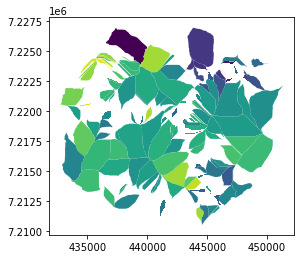

In [746]:
#Step 5: Polygonize the splitter raster (this seems like the best way to plot by stack value)

from rasterio.features import shapes
mask = None
with rasterio.Env():
    with rasterio.open((os.path.join(data_directory, splitter_raster))) as src:
        image = src.read(1) # first band
        results = (
        {'properties': {splitter_raster_var: v}, 'geometry': s}
        for i, (s, v) 
        in enumerate(
            shapes(image, mask=mask, transform=src.transform)))

geoms = list(results)

gpd_polygonized_raster  = gp.GeoDataFrame.from_features(geoms)

#https://gis.stackexchange.com/questions/187877/how-to-polygonize-raster-to-shapely-polygons/187883

gpd_polygonized_raster = gpd_polygonized_raster[gpd_polygonized_raster[splitter_raster_var] >= 0.0]

df[splitter_raster_var] = df[splitter_raster_var].astype(int)
df_gb_mean = df.groupby('junct').mean().reset_index()

# Add aspect and outlet elevation 
df_gb_mean = df_gb_mean.merge(grouped, on='junct')

gpd_polygonized_raster = gpd_polygonized_raster.merge(df_gb_mean, on='junct')

#Add basin area column 
gpd_polygonized_raster['Area'] = gpd_polygonized_raster['geometry'].area

#Eliminate basins that are too small - not sure how these got in here...
gpd_polygonized_raster.loc[gpd_polygonized_raster.Area < 100.0, 'Area'] = np.nan

gpd_polygonized_raster=gpd_polygonized_raster.dropna()

#Now you can do this:
gpd_polygonized_raster.plot(column='ndvi_std')

## Sample stack at channel points

In [626]:
from geopandas import GeoDataFrame
from shapely.geometry import Point

df = pd.read_csv(os.path.join(data_directory, 'seward_hsp__D_CN.csv'))

geometry = [Point(xy) for xy in zip(df.longitude, df.latitude)]
df = df.drop(['longitude', 'latitude'], axis=1)
gdf = GeoDataFrame(df, crs="EPSG:4326", geometry=geometry)

gdf = gdf.to_crs('EPSG:32603')
gdf.head()

,Junction Index,Stream Order,NI,receiver_NI,receiver_JI,geometry
0,0,1,2736,2584,1,POINT (448204.515 7230728.523)
1,0,1,2584,2435,1,POINT (448202.208 7230730.458)
2,0,1,2435,2291,1,POINT (448200.371 7230732.497)
3,0,1,2291,2151,1,POINT (448198.066 7230734.544)
4,0,1,2151,2016,1,POINT (448196.227 7230736.471)


In [627]:
stack = ["seward2_hsp_elev.tif", "seward_hsp__dinf_area.tif"]
stack_names = ["Elev", "Dinf"]

coords = [(x,y) for x,y in zip(gdf['geometry'].x , gdf['geometry'].y)]

for i, raster_file in enumerate(stack):
    # Sample the raster at every point location and store values in DataFrame
    src = rasterio.open((os.path.join(data_directory, raster_file)))
    col = stack_names[i]
    print(col)
    gdf[col] = [x[0] for x in src.sample(coords)]
    src.close()

Elev
Dinf


In [658]:
gdf.loc[gdf.Elev < 0.0, 'Elev'] = np.nan
gdf.loc[gdf.Elev > 2000.0, 'Elev'] = np.nan
gdf.loc[gdf.Dinf < 4.0, 'Dinf'] = np.nan

<AxesSubplot:>

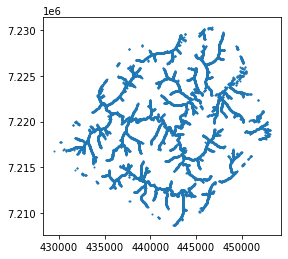

In [659]:
gdf[gdf['Dinf'] > 5E4][::10].plot(markersize=1)

### Add channel gradient to points

In [660]:
import math

gdf['Channel slope'] = np.nan

for x in range(len(gdf)-2):
  

    # This is technically the more precise code but it's suuuuuuper slow:
    # x_vals = [a_tuple[0] for a_tuple in [gdf['geometry'].x[0],gdf['geometry'].x[2]]]
    # y_vals = [a_tuple[1] for a_tuple in [gdf['geometry'].y[0],gdf['geometry'].y[2]]]

    x_vals = [a_tuple[0] for a_tuple in [coords[x],coords[x + 2]]]
    y_vals = [a_tuple[1] for a_tuple in [coords[x],coords[x + 2]]]

    run = math.sqrt((x_vals[1]-x_vals[0])**2)+((y_vals[1]-y_vals[0])**2)

    if run < 30: 
        # Idea is that points that are sequentially next to each other but far away will give too big a distance measurement
        rise = gdf['Elev'].iloc[x] - gdf['Elev'].iloc[x + 2]

        gdf['Channel slope'].iloc[x + 1] = rise/run

gdf['Channel slope'] = gdf['Channel slope'].abs()
# You know, I don't know why I was getting some negative and positive rises....whoops

/dartfs-hpc/rc/home/1/f005dv1/.conda/envs/geopandas/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [685]:
gdf['ksn'] = gdf['Channel slope'] * gdf['Dinf']**0.45

/dartfs-hpc/rc/home/1/f005dv1/.conda/envs/geopandas/lib/python3.9/site-packages/geopandas/geodataframe.py:1299: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super(GeoDataFrame, self).__getitem__(key)


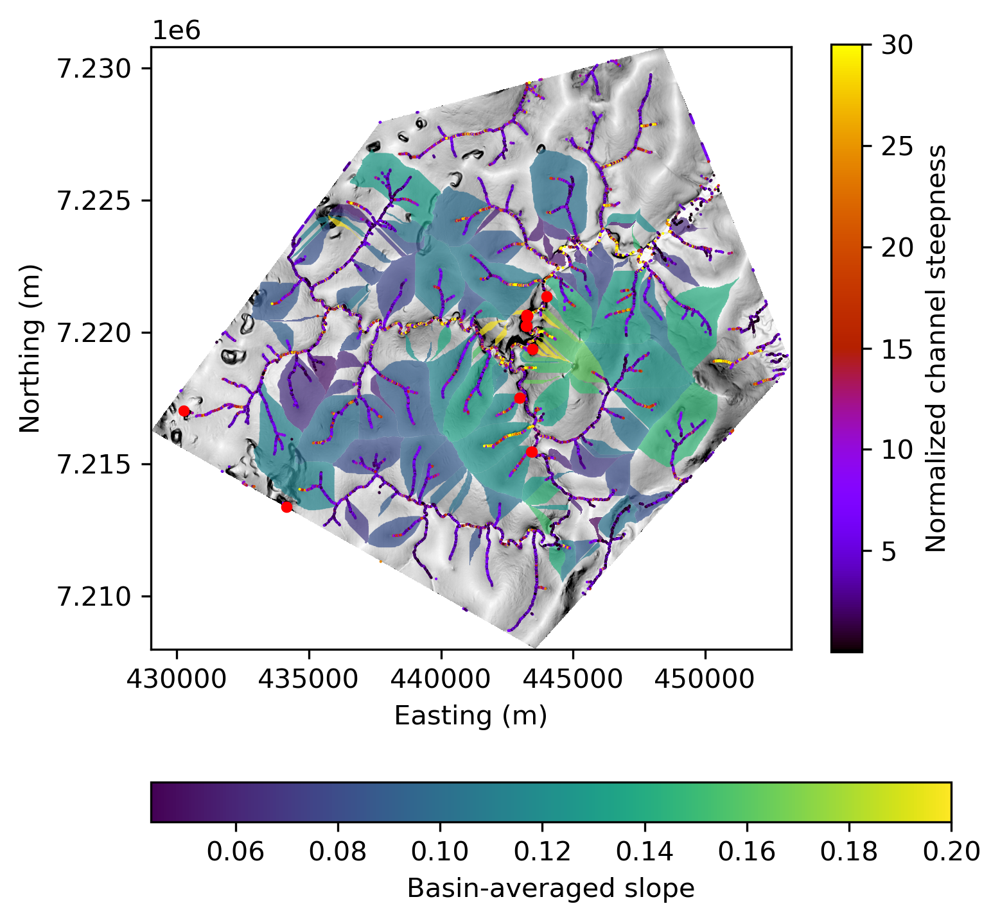

In [1100]:
import matplotlib
from rasterio.plot import show

slopeshade = rasterio.open((os.path.join(data_directory,'slope_15m.tif')), masked=True)

fig, ax = plt.subplots(figsize=(5,5), dpi=300)
slope = rasterio.plot.show(slopeshade, vmin=0.0, vmax=0.4, cmap='binary', ax=ax, zorder=0)                            
basins = gpd_polygonized_raster.plot(column='slope_15m', cmap='viridis', vmax=0.2, ax=ax, alpha=0.7, zorder=1, legend=True,
                                    legend_kwds={'label': "Basin-averaged slope",
                        'orientation': "horizontal"})
network = gdf[::10][gdf['Dinf'] > 5E4].plot(column='ksn', cmap='gnuplot', vmax = 30, edgecolor='none', markersize=1, ax=ax,zorder=2,
                                            legend=True,
                                            legend_kwds={'label': "Normalized channel steepness",
                                                         'orientation': "vertical"})
network2 = gdf[(gdf['Dinf'] > 1E4)  & (gdf['Channel slope'] > 0.5)].plot(color='r', markersize=10, ax=ax,zorder=3)

ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')

fig.tight_layout()

plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','channel_basin_steepness.png')))
plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','channel_basin_steepness.svg')))

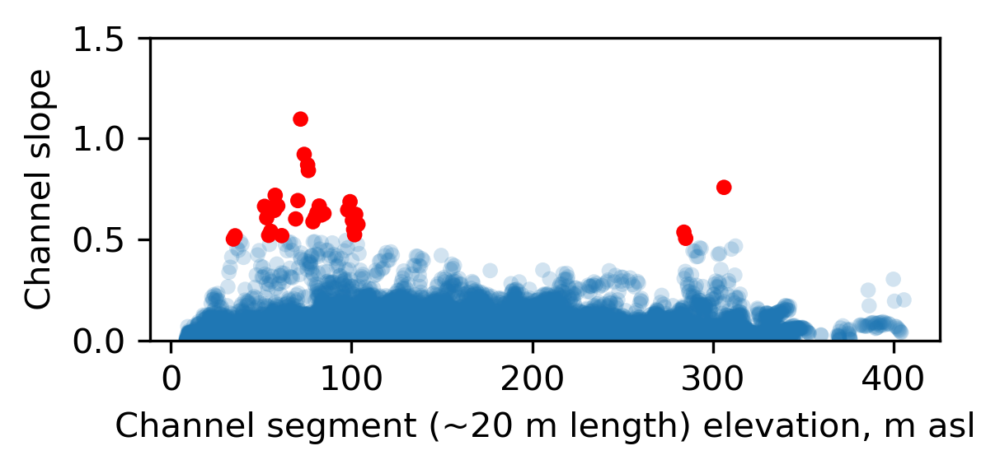

In [1103]:
fig, ax = plt.subplots(figsize=(4,2), dpi=300)
scatter = gdf[(gdf['Dinf'] > 1E4) ].plot.scatter(x='Elev', y='Channel slope', edgecolor='none', alpha=.2, ax=ax, zorder=0)
scatter = gdf[(gdf['Dinf'] > 1E4) & (gdf['Channel slope'] > 0.5)].plot.scatter(x='Elev', y='Channel slope', edgecolor='none', color='r', alpha=1, ax=ax, zorder=0)
ax.set_ylim(0,1.5)

ax.set_xlabel('Channel segment (~20 m length) elevation, m asl')
fig.tight_layout()

plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','channel_seg_steepness.png')))
plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','channel_seg_steepness.svg')))

## Analyze basin-averaged displacement vs terrain factors

/dartfs-hpc/rc/home/1/f005dv1/.conda/envs/geopandas/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


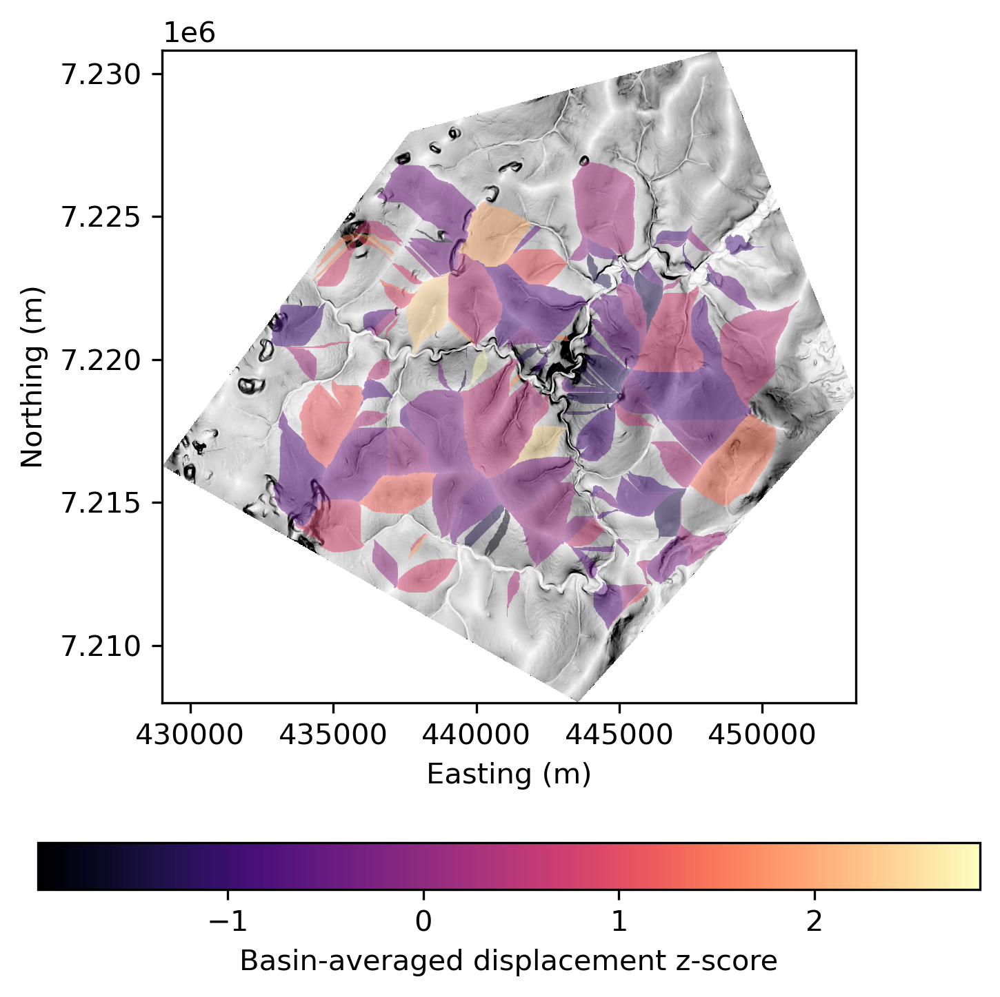

In [1075]:
cardinal_order = ["N", "NE", "E", "SE","S", "SW", "W", "NW"]

gpd_polygonized_raster['disp_zscore'] = np.nan

fig, ax = plt.subplots(figsize=(5,5),dpi=300)
slope = rasterio.plot.show(slopeshade, vmin=0.0, vmax=0.4, cmap='binary',  ax=ax, zorder=0)   

for cardinal in gpd_polygonized_raster.First.unique():
    numerator = gpd_polygonized_raster.loc[gpd_polygonized_raster['First'] == cardinal]['insar_displacement'] - gpd_polygonized_raster.loc[gpd_polygonized_raster['First'] == cardinal]['insar_displacement'].mean()
    denomenator = gpd_polygonized_raster.loc[gpd_polygonized_raster['First'] == cardinal]['insar_displacement'].std(ddof=0)
    zscores = numerator/denomenator
    gpd_polygonized_raster['disp_zscore'].loc[gpd_polygonized_raster['First'] == cardinal] = zscores
    
basins = gpd_polygonized_raster.plot(column='disp_zscore',cmap='magma', alpha=0.5, ax=ax, zorder=1, legend=True, 
                                     legend_kwds={'label': "Basin-averaged displacement z-score",
                        'orientation': "horizontal"})

#divider = make_axes_locatable(ax)
#cax = divider.append_axes("right", size="5%", pad=0.2)

#fig.get_axes()[1].set_ylabel('Basin-averaged displacement z-score', labelpad=10, rotation=270)

ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')

fig.tight_layout()

plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','basin_zscore_map.png')))
plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','basin_zscore_map.svg')))



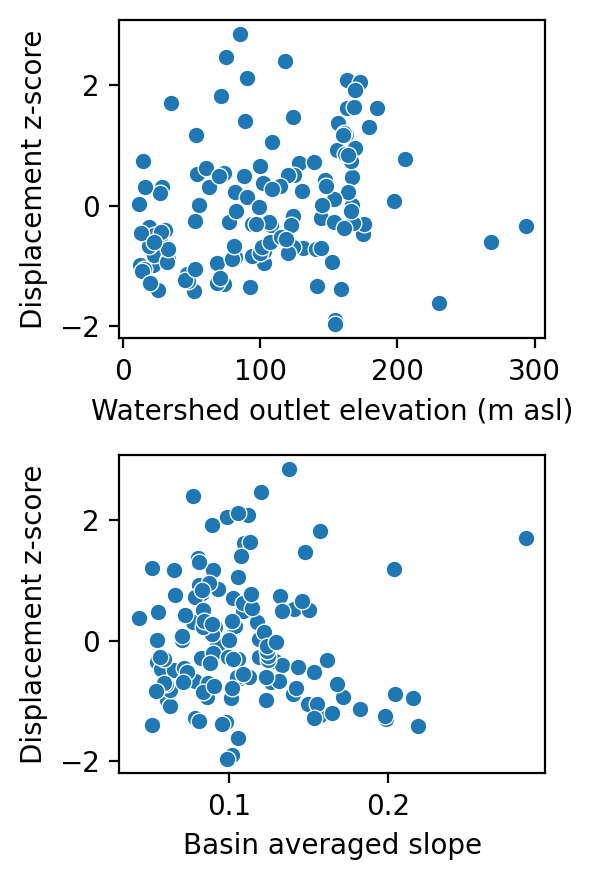

In [1070]:
fig, ax = plt.subplots(2,1, figsize=(3, 4.5),dpi=200)
scatter1 = sns.scatterplot(x='Outlet Elev', y='disp_zscore', data=gpd_polygonized_raster, ax=ax[0])
scatter2 = sns.scatterplot(x='slope_15m', y='disp_zscore', data=gpd_polygonized_raster, ax=ax[1])
ax[0].set_ylabel('Displacement z-score')
ax[0].set_xlabel('Watershed outlet elevation (m asl)')
ax[1].set_ylabel('Displacement z-score')
ax[1].set_xlabel('Watershed outlet elevation (m asl)')
ax[1].set_xlabel('Basin averaged slope')

fig.tight_layout()

plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','zscores_vs_basin_morph.png')))
plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','zscores_vs_basin_morph.svg')))

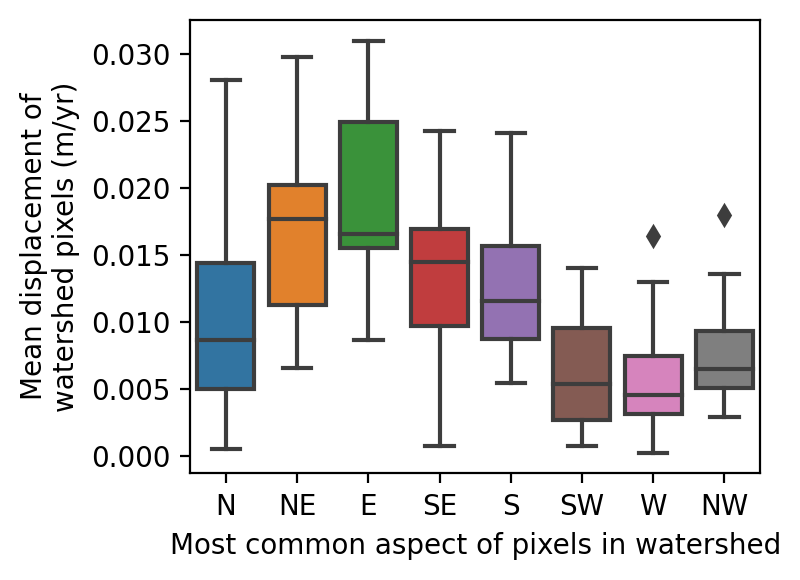

In [1105]:
fig, ax = plt.subplots(figsize=(4,3),dpi=200)
boxplot = sns.boxplot(x='First', y='insar_displacement', data=df_gb_mean, order=cardinal_order, ax=ax)
ax.set_ylabel('Mean displacement of\nwatershed pixels (m/yr)')
ax.set_xlabel('Most common aspect of pixels in watershed')

fig.tight_layout()

plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','basin_orientation_displacement.png')))
plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','basin_orientation_displacement.svg')))

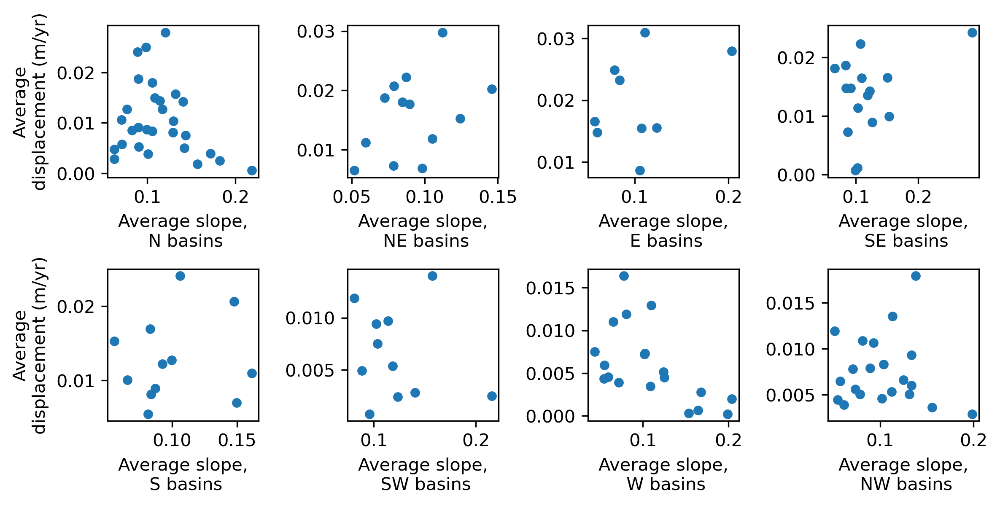

In [817]:
fig, ax = plt.subplots(2,4, figsize=(8,4), dpi=300)
for x, cardinal in enumerate(cardinal_order):
    # Bro how DO you do this, this was fun tho, hope it's an interview question someday
    if x/3 > 1:
        j=x-4
        i=1
    else:
        j=x
        i=0
    scatter = gpd_polygonized_raster.loc[gpd_polygonized_raster['First'] == cardinal].plot.scatter(
        x='slope_15m', y='insar_displacement',
        ax=ax[i, j])
    ax[i, j].set_xlabel('Average slope,\n ' + cardinal + ' basins')
    ax[i, j].set_ylabel(None)
    ax[i,0].set_ylabel('Average\ndisplacement (m/yr)')
fig.tight_layout()

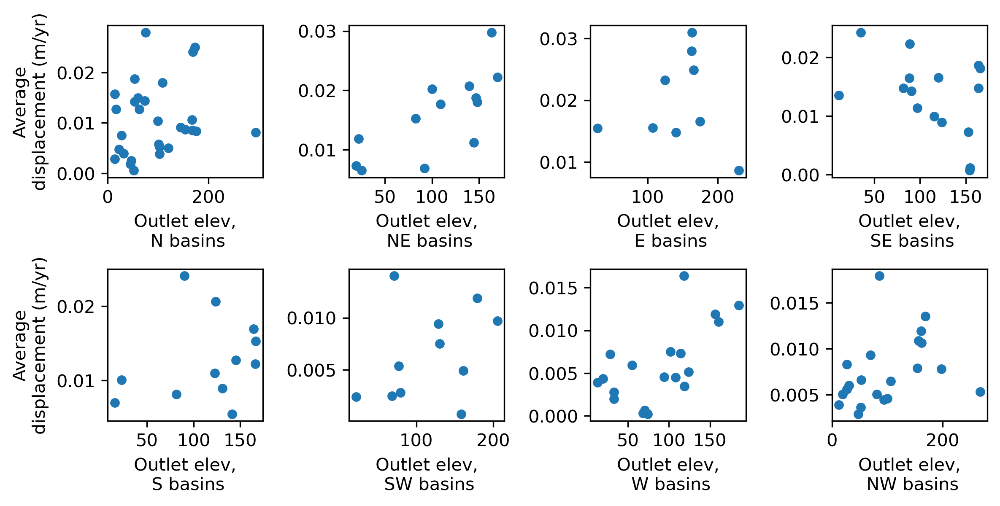

In [819]:
fig, ax = plt.subplots(2,4, figsize=(8,4), dpi=300)
for x, cardinal in enumerate(cardinal_order):
    # Bro how DO you do this, this was fun tho, hope it's an interview question someday
    if x/3 > 1:
        j=x-4
        i=1
    else:
        j=x
        i=0
    scatter = gpd_polygonized_raster.loc[gpd_polygonized_raster['First'] == cardinal].plot.scatter(
        x='Outlet Elev', y='insar_displacement',
        ax=ax[i, j])
    ax[i, j].set_xlabel('Outlet elev,\n ' + cardinal + ' basins')
    ax[i, j].set_ylabel(None)
    ax[i,0].set_ylabel('Average\ndisplacement (m/yr)')
fig.tight_layout()

## Make heatmaps

In [895]:
df = pd.read_csv((os.path.join(data_directory,'splitter_raster_stack_sample.csv')))

In [896]:
# Clean.

curv_column = 'seward_hsp__tan_curv_LW'
slope_column = 'slope_15m'
    
df.loc[df[slope_column]< -100.0 ] = np.nan
df.loc[df[curv_column]< -1.0 ] = np.nan
df.loc[df['insar_displacement']< -2.0 ] = np.nan
#df = df.dropna()

# Satellite data clipped form GEE has some areas outside of the DEM and the nodata are unfortunately 0. 
names_of_nodata = ['PS_ndvi_Jun', 'moisture_std', 'wetness_std', 'PS_ndvi_Aug', 'ndvi_std', 'wetness_max', 'ndvi_max']

for col in names_of_nodata:
    df.loc[df[col] == 0.0, col] = np.nan

In [837]:
df.head()

,Unnamed: 0,y,x,junct,seward_hsp__tan_curv,PS_ndvi_Jun,insar_new_clip,insar_displacement,moisture_std,seward2_hsp_elev,...,seward_hsp__dinf_area,slope_15m,PS_ndvi_Aug,hcc_AllBasins,aspect_15m,ndvi_std,seward_hsp__tan_curv_LW,wetness_max,ABOVE_LCV_Seward,ndvi_max
0,3076958.0,7.230295e+06,446678.273593,14.0,-0.002597,NaN,0.0,-0.00421,NaN,100.369320,...,1186.5195,0.151516,NaN,14.0,261.56793,NaN,0.001800,NaN,0.0,NaN
1,3076959.0,7.230295e+06,446680.273593,14.0,-0.001718,NaN,0.0,-0.00421,NaN,100.625145,...,1419.2355,0.151516,NaN,14.0,261.56793,NaN,0.002151,NaN,0.0,NaN
2,3076960.0,7.230295e+06,446682.273593,14.0,-0.000716,NaN,0.0,-0.00421,NaN,100.865776,...,1783.4161,0.151516,NaN,14.0,261.56793,NaN,0.002498,NaN,0.0,NaN
3,3076961.0,7.230295e+06,446684.273593,14.0,0.000360,NaN,0.0,-0.00421,NaN,101.091030,...,2269.7957,0.151516,NaN,14.0,261.56793,NaN,0.002838,NaN,0.0,NaN
4,3076962.0,7.230295e+06,446686.273593,14.0,0.001451,NaN,0.0,-0.00421,NaN,101.304640,...,2806.1938,0.151516,NaN,14.0,261.56793,NaN,0.003168,NaN,0.0,NaN


/scratch/ipykernel_53998/1995174074.py:115: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[y,x].set_xticklabels(["$10^{{{:.0f}}}$".format(x) for x in range(7)][::2])


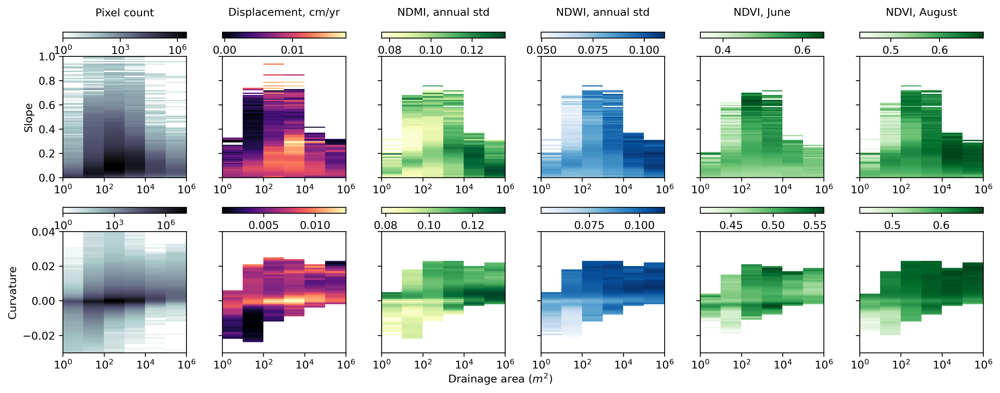

In [1291]:
variable_list= ['insar_displacement', 'insar_displacement','moisture_std', 'wetness_std', 'PS_ndvi_Jun', 'PS_ndvi_Aug']
variable_labels = ['X', 'Displacement, cm/yr','NDMI, annual std', 'NDWI, annual std', 'NDVI, June', 'NDVI, August']

drainage_column = 'seward_hsp__dinf_area'

slope_curve_label = ['Slope', 'Curvature']

yaxis_list = [slope_column, curv_column]
color_theme_list = ['magma','magma', 'YlGn', 'Blues', 'Greens', 'Greens']


fig, ax = plt.subplots(len(yaxis_list),len(variable_list), figsize=(13,5),dpi=300)

for y in range(len(yaxis_list)):
    for x in range(len(variable_list)):
        bin_2_string = yaxis_list[y]
        #variable_string = 'NDWI std'
        variable_string = variable_list[x]
        color_theme = color_theme_list[x]
        min_counts = 100
        big_da_bins = True
        
        if x == 0:
            plot_counts = True
        else:
            plot_counts = False

        bin_2 = df[bin_2_string]
        variable = df[variable_string]

        if bin_2_string == curv_column:
            bin_2_array_spacing = 0.001
        else:
            bin_2_array_spacing = 0.01

        #Bins for area
        if big_da_bins == True:
            da_array = 10.**(np.arange(0, 7)) 
        else:
            a1=10.**(np.arange(0, 7)) 
            a2 = np.arange(1,10,1)
            da_array=np.outer(a1, a2).flatten()

        bin_2_array = np.arange(bin_2.min(), bin_2.max(), bin_2_array_spacing)

        #Cut the dataframe by bins 
        df['bin_dinf'] = pd.cut(df[drainage_column],bins=da_array,
                                labels=range(len(da_array)-1)
                                #labels=da_array[:-1]
                                     )
        df['bin_2'] = pd.cut(bin_2,bins=bin_2_array, 
                                 labels=range(len(bin_2_array)-1)
                                 #labels=bin_2_array[:-1]
                                      )

        df_out = df.groupby(['bin_2','bin_dinf'])[variable_string]

        #Make the array by reshaping the output df
        arr = df_out.mean().sort_index().values.reshape(len(bin_2_array)-1,len(da_array)-1)
        #Y axis is rows in reshape (first value in reshape)

        # Count occurrences in each bin in heatmap
        counts = df_out.count().sort_index().values.reshape(len(bin_2_array)-1,len(da_array)-1)

        # Eliminate datapoints whose occurrence is below the specific threshold
        arr[counts < min_counts] = np.nan
        #counts[counts < min_counts] = 0

        
        # Make plots
        import matplotlib.ticker as mtick

        if plot_counts == True:
            im = ax[y,x].imshow(counts, cmap='bone_r', interpolation='none', aspect='auto',
#                           extent=[0, np.max(da_array), np.min(bin_2_array), np.max(bin_2_array)],
                        extent=[0, len(da_array)-1, np.min(bin_2_array), np.max(bin_2_array)],
            #               extent=[0, len(da_array)-1, 0, len(bin_2_array)-1],
                           norm=colors.LogNorm(),
                           origin='lower')
            variable_labels[x] = 'Pixel count'
        else:
            im = ax[y,x].imshow(arr, cmap=color_theme, interpolation='none', aspect='auto',
#                           extent=[0, np.max(da_array), np.min(bin_2_array), np.max(bin_2_array)],
                        extent=[0, len(da_array)-1, np.min(bin_2_array), np.max(bin_2_array)],
            #               extent=[0, len(da_array)-1, 0, len(bin_2_array)-1],
                           origin='lower')

    #    if big_da_bins == True:
    #         ax[y,x].xticks(ticks=range(len(a1)), labels=da_array, rotation='vertical')

    #   else: 
    #         ax[y,x].xticks(ticks=[0, 9, 18, 27, 36, 45, 54], labels=da_array[::9], rotation='vertical')


        divider = make_axes_locatable(ax[y,x])
        # Add an axes to the right of the main axes.
        cax = divider.append_axes("top", size="5%", pad="15%")
        cb = fig.colorbar(im, cax=cax, orientation='horizontal')
        
        if y == 0:
            cb.set_label(variable_labels[x], labelpad=-45)
            ax[y,x].set_ylim(0.0, 1.0)
        else:
            ax[y,x].set_ylim(-0.03, 0.04)

        ax[y,x].set_ylabel(bin_2_string)
#         ax[y,x].set_xscale('log')
#         ax[y,x].set_xticks([10**x for x in np.arange(0., 7., 1.)])

#         print(ax[y,x].get_xticklabels())

        if len(ax[y,x].get_xticklabels()) == (len(da_array)+1):
            ax[y,x].set_xticklabels(["$10^{{{:.0f}}}$".format(x) for x in range(7)])
        elif len(ax[y,x].get_xticklabels()) == ((len(da_array))+1)/2:
            ax[y,x].set_xticklabels(["$10^{{{:.0f}}}$".format(x) for x in range(7)][::2])
        elif len(ax[y,x].get_xticklabels()) == ((len(da_array))+1)/3:
            ax[y,x].set_xticklabels(["$10^{{{:.0f}}}$".format(x) for x in range(7)][::3])
            
            
#         ax[y,x].xaxis.set_major_formatter(mtick.LogFormatterSciNotation())
        if x > 0:
            ax[y,x].set(ylabel=None)
            ax[y,x].set_yticklabels([])
        else:
            ax[y,x].set_ylabel(slope_curve_label[y])
        
        

        #ax[x].set_xlabel('Drainage area (m^2)')

        #ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2E'))
        #https://stackoverflow.com/questions/41849535/matplotlib-format-major-ticks-not-retrieving-axes-tick-labels
        #https://stackoverflow.com/questions/25750170/show-decimal-places-and-scientific-notation-on-the-axis-of-a-matplotlib-plot/49330649#49330649

        #cb.mappable.set_clim(0.0, 1.5)
        #https://stackoverflow.com/questions/69435068/change-colorbar-limit-for-changing-scale-with-matplotlib-3-3

        
fig.text(0.5, 0, "Drainage area ($m^{2}$)", ha='center')
        
fig.tight_layout()
plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','heatmaps.png')))
plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','heatmaps.svg')))

## But now I want map-maps with my heatmaps

In [ ]:
src = rasterio.open(os.path.join(data_directory, stack[x], '.tif'))
src_extent=[src.bounds[0], src.bounds[2], src.bounds[1], src.bounds[3]]
src_read=src.read(1, masked=True)
im1 = ax.imshow(dinf_mask, extent=src_extent)

/scratch/ipykernel_53998/1415319616.py:133: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[y,x].set_xticklabels(["$10^{{{:.0f}}}$".format(x) for x in range(7)][::2])


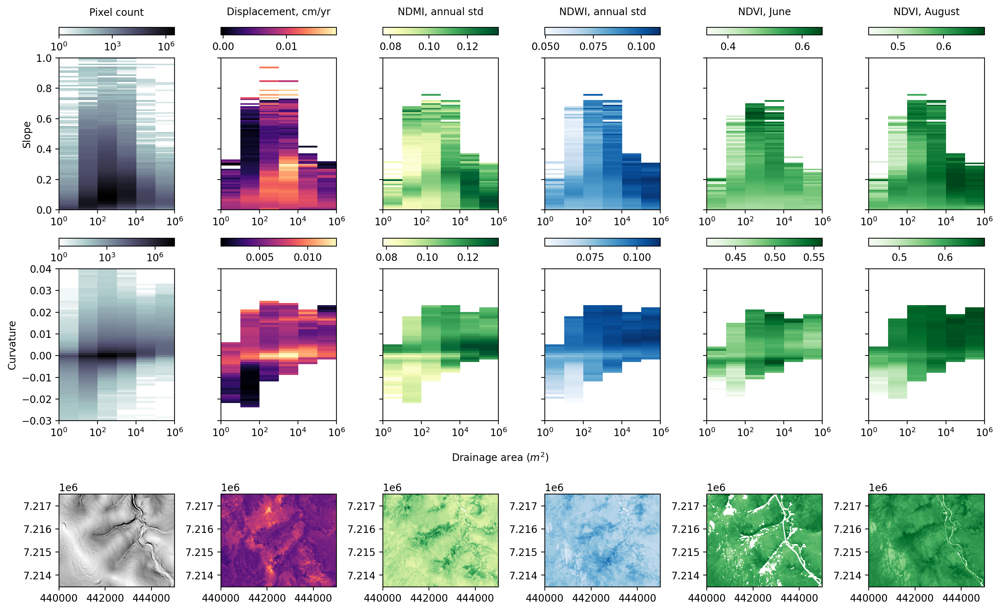

In [1347]:
variable_list= ['slope_15m', 'insar_displacement','moisture_std', 'wetness_std', 'PS_ndvi_Jun', 'PS_ndvi_Aug']
variable_labels = ['X', 'Displacement, cm/yr','NDMI, annual std', 'NDWI, annual std', 'NDVI, June', 'NDVI, August']

drainage_column = 'seward_hsp__dinf_area'

slope_curve_label = ['Slope', 'Curvature']

yaxis_list = [slope_column, curv_column]
color_theme_list = ['binary','magma', 'YlGn', 'Blues', 'Greens', 'Greens']


fig, ax = plt.subplots((len(yaxis_list)+1),len(variable_list), figsize=(14,9),dpi=200)

# Number of subplots is 1, 2, 3, whereas range is 0, 1, 2

for y in range(len(yaxis_list)+1):
    for x in range(len(variable_list)):
        if y == 2:
            src = rasterio.open(os.path.join(data_directory, variable_list[x] + '.tif'))
            src_extent=[src.bounds[0], src.bounds[2], src.bounds[1], src.bounds[3]]
            src_read=src.read(1, masked=True)
            if x == 0: #Make slopes different vmax
                im1 = ax[y,x].imshow(src_read, extent=src_extent, cmap=color_theme_list[x], vmin=0.0, vmax=0.4)
            elif x == 1: #Make velocities different vmax
                im1 = ax[y,x].imshow(src_read, extent=src_extent, cmap=color_theme_list[x], vmax=0.1)
            else:
                im1 = ax[y,x].imshow(src_read, extent=src_extent, cmap=color_theme_list[x])
            #ax.ticklabel_format('sci', axis='x')
            ax[y,x].set_ylim((7.2135e6, 7.2175e6))
            ax[y,x].set_xlim((4.4e5, 4.45e5))
            

        else:
            bin_2_string = yaxis_list[y]
            #variable_string = 'NDWI std'
            variable_string = variable_list[x]
            color_theme = color_theme_list[x]
            min_counts = 100
            big_da_bins = True

            if x == 0:
                plot_counts = True
            else:
                plot_counts = False

            bin_2 = df[bin_2_string]
            variable = df[variable_string]

            if bin_2_string == curv_column:
                bin_2_array_spacing = 0.001
            else:
                bin_2_array_spacing = 0.01

            #Bins for area
            if big_da_bins == True:
                da_array = 10.**(np.arange(0, 7)) 
            else:
                a1=10.**(np.arange(0, 7)) 
                a2 = np.arange(1,10,1)
                da_array=np.outer(a1, a2).flatten()

            bin_2_array = np.arange(bin_2.min(), bin_2.max(), bin_2_array_spacing)

            #Cut the dataframe by bins 
            df['bin_dinf'] = pd.cut(df[drainage_column],bins=da_array,
                                    labels=range(len(da_array)-1)
                                    #labels=da_array[:-1]
                                         )
            df['bin_2'] = pd.cut(bin_2,bins=bin_2_array, 
                                     labels=range(len(bin_2_array)-1)
                                     #labels=bin_2_array[:-1]
                                          )

            df_out = df.groupby(['bin_2','bin_dinf'])[variable_string]

            #Make the array by reshaping the output df
            arr = df_out.mean().sort_index().values.reshape(len(bin_2_array)-1,len(da_array)-1)
            #Y axis is rows in reshape (first value in reshape)

            # Count occurrences in each bin in heatmap
            counts = df_out.count().sort_index().values.reshape(len(bin_2_array)-1,len(da_array)-1)

            # Eliminate datapoints whose occurrence is below the specific threshold
            arr[counts < min_counts] = np.nan
            #counts[counts < min_counts] = 0


            # Make plots
            import matplotlib.ticker as mtick

            if plot_counts == True:
                im = ax[y,x].imshow(counts, cmap='bone_r', interpolation='none', aspect='auto',
        #                           extent=[0, np.max(da_array), np.min(bin_2_array), np.max(bin_2_array)],
                            extent=[0, len(da_array)-1, np.min(bin_2_array), np.max(bin_2_array)],
                #               extent=[0, len(da_array)-1, 0, len(bin_2_array)-1],
                               norm=colors.LogNorm(),
                               origin='lower')
                variable_labels[x] = 'Pixel count'
            else:
                im = ax[y,x].imshow(arr, cmap=color_theme, interpolation='none', aspect='auto',
        #                           extent=[0, np.max(da_array), np.min(bin_2_array), np.max(bin_2_array)],
                            extent=[0, len(da_array)-1, np.min(bin_2_array), np.max(bin_2_array)],
                #               extent=[0, len(da_array)-1, 0, len(bin_2_array)-1],
                               origin='lower')

        #    if big_da_bins == True:
        #         ax[y,x].xticks(ticks=range(len(a1)), labels=da_array, rotation='vertical')

        #   else: 
        #         ax[y,x].xticks(ticks=[0, 9, 18, 27, 36, 45, 54], labels=da_array[::9], rotation='vertical')


            divider = make_axes_locatable(ax[y,x])
            # Add an axes to the right of the main axes.
            cax = divider.append_axes("top", size="5%", pad="15%")
            cb = fig.colorbar(im, cax=cax, orientation='horizontal')

            if y == 0:
                cb.set_label(variable_labels[x], labelpad=-45)
                ax[y,x].set_ylim(0.0, 1.0)
            else:
                ax[y,x].set_ylim(-0.03, 0.04)

            ax[y,x].set_ylabel(bin_2_string)
        #         ax[y,x].set_xscale('log')
        #         ax[y,x].set_xticks([10**x for x in np.arange(0., 7., 1.)])

        #         print(ax[y,x].get_xticklabels())

            if len(ax[y,x].get_xticklabels()) == (len(da_array)+1):
                ax[y,x].set_xticklabels(["$10^{{{:.0f}}}$".format(x) for x in range(7)])
            elif len(ax[y,x].get_xticklabels()) == ((len(da_array))+1)/2:
                ax[y,x].set_xticklabels(["$10^{{{:.0f}}}$".format(x) for x in range(7)][::2])
            elif len(ax[y,x].get_xticklabels()) == ((len(da_array))+1)/3:
                ax[y,x].set_xticklabels(["$10^{{{:.0f}}}$".format(x) for x in range(7)][::3])


        #         ax[y,x].xaxis.set_major_formatter(mtick.LogFormatterSciNotation())
            if x > 0:
                ax[y,x].set(ylabel=None)
                ax[y,x].set_yticklabels([])
            else:
                ax[y,x].set_ylabel(slope_curve_label[y])



#ax[x].set_xlabel('Drainage area (m^2)')

#ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2E'))
#https://stackoverflow.com/questions/41849535/matplotlib-format-major-ticks-not-retrieving-axes-tick-labels
#https://stackoverflow.com/questions/25750170/show-decimal-places-and-scientific-notation-on-the-axis-of-a-matplotlib-plot/49330649#49330649

#cb.mappable.set_clim(0.0, 1.5)
#https://stackoverflow.com/questions/69435068/change-colorbar-limit-for-changing-scale-with-matplotlib-3-3

        
fig.text(0.5, 0.28, "Drainage area ($m^{2}$)", ha='center')
        
fig.tight_layout()
plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','heatmaps2.png')))
plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','heatmaps2.svg')))

## Make traditional slope-area plots

In [1110]:
#Bins for area
a1=10.**(np.arange(1, 7)) 
a2 = np.arange(1,10,1)
bin_edges=np.outer(a1, a2).flatten()

mean_stat_sa = binned_statistic(df[drainage_column],df[slope_column],
                            statistic='median',
                            bins=bin_edges)

mean_stat_ca = binned_statistic(df[drainage_column],df[curv_column],
                            statistic='median',
                            bins=bin_edges)

mean_stat_dd = binned_statistic(df[drainage_column],df['insar_displacement'],
                            statistic='median',
                            bins=bin_edges)

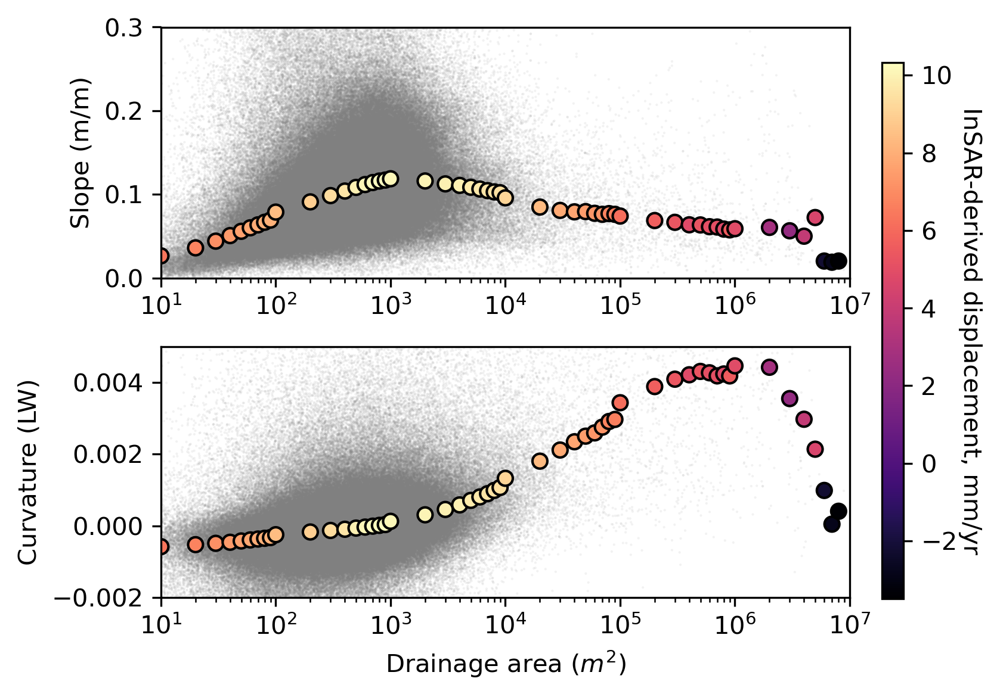

In [1276]:
fig, ax = plt.subplots(2,1, figsize=(6,4), dpi=300)

scatter = ax[0].scatter(df[drainage_column][::100], df[slope_column][::100],
                      c='gray',alpha=0.1, edgecolor='none')
scatter.set_sizes([1])
im2 = ax[0].scatter(mean_stat_sa.bin_edges[:-1],mean_stat_sa.statistic,c=(mean_stat_dd.statistic*1000),
                    cmap='magma',
                   edgecolor='k',
                   zorder=1)

scatter2 = ax[1].scatter(df[drainage_column][::100], df[curv_column][::100],
                      c='gray',alpha=0.1, edgecolor='none')
scatter2.set_sizes([1])
im = ax[1].scatter(mean_stat_ca.bin_edges[:-1],mean_stat_ca.statistic,c=(mean_stat_dd.statistic*1000),
                   cmap='magma',
                   edgecolor='k')

#plt.axhline(0.0, color='k', linestyle='--', alpha=0.3)
ax[0].set_xlim((1E1, 1E7))
ax[0].set_ylim((0, 0.3))
ax[0].set_xscale('log')
ax[0].set_ylabel('Slope (m/m)')

ax[1].set_xlim((1E1, 1E7))
ax[1].set_ylim((-0.002, 0.005))
ax[1].set_xlabel('Drainage area ($m^{{{2}}}$)')
ax[1].set_ylabel('Curvature (LW)')
ax[1].set_xscale('log')

fig.tight_layout()

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.83, 0.15, 0.02, 0.75])
cb = fig.colorbar(im, cax=cbar_ax)
cb.set_label('InSAR-derived displacement, mm/yr', rotation=270, labelpad=10)
plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','slope_curve_area.png')))
#plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','slope_curve_area.svg')))

## Mapping displacement hotspots

In [935]:
import matplotlib
from rasterio.plot import show

slope_logical = (df[slope_column] > 0.10)  & (df[slope_column] < 0.25)
curv_logical = (df[curv_column] > -0.002) & (df[curv_column] < 0.002)
dinf_logical = (df[drainage_column] > 1e2) & (df[drainage_column] < 1e4)

hi_disp_mask = df[slope_logical & curv_logical & dinf_logical]



In [1004]:
hotspots = gpd.GeoDataFrame(
    hi_disp_mask[::500], geometry=gpd.points_from_xy(hi_disp_mask[::500].x, hi_disp_mask[::500].y))

In [1005]:
hotspots['disp_zscore'] = np.nan
hotspots['asp_card'] = pd.cut(hotspots[aspect_col], [0.0, 33.75, 78.75, 101.25, 146.25, 191.25, 236.25, 281.25, 326.25, 360.0],
                    labels=["N", "NE", "E", "SE","S", "SW", "W", "NW", "N"],
                    ordered=False)

for cardinal in hotspots.asp_card.unique():
    #hotspots['disp_zscore'] = (hotspots['insar_displacement'].loc[hotspots['asp_card'] == cardinal] - hotspots['insar_displacement'].loc[hotspots['asp_card'] == cardinal].mean())/hotspots['insar_displacement'].loc[hotspots['asp_card'] == cardinal].std(ddof=0)
    numerator = hotspots['insar_displacement'].loc[hotspots['asp_card'] == cardinal] - hotspots['insar_displacement'].loc[hotspots['asp_card'] == cardinal].mean()
    denomenator = hotspots['insar_displacement'].loc[hotspots['asp_card'] == cardinal].std(ddof=0)
    zscores = numerator/denomenator
    hotspots['disp_zscore'].loc[hotspots['asp_card'] == cardinal] = zscores

/dartfs-hpc/rc/home/1/f005dv1/.conda/envs/geopandas/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


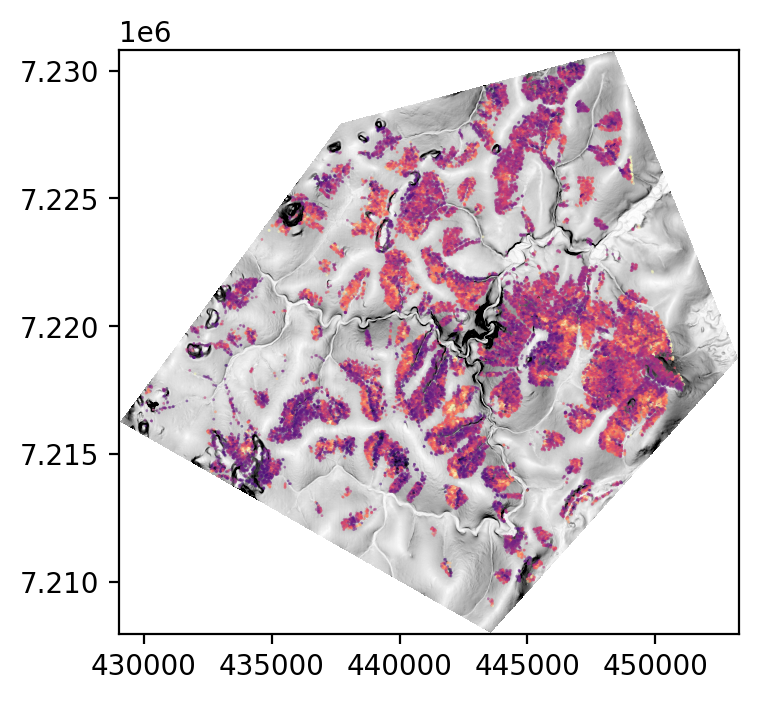

In [1006]:
slopeshade = rasterio.open((os.path.join(data_directory,'slope_15m.tif')), masked=True)

fig, ax = plt.subplots(figsize=(4,4), dpi=200)
slope = rasterio.plot.show(slopeshade, vmin=0.0, vmax=0.4, cmap='binary', ax=ax, zorder=0)
points = hotspots.plot(column="disp_zscore", cmap='magma', vmin=-3.0, vmax=3.0, alpha=0.5, markersize=1, edgecolor='none', zorder=1, ax=ax)



## Show slope and curvature locations

In [1219]:
from rasterio.mask import mask
curv = rasterio.open(os.path.join(data_directory, 'seward_hsp__tan_curv_LW.tif'))
curv_read = curv.read(1, masked=True)

slopeshade = rasterio.open((os.path.join(data_directory,'slope_15m.tif')), masked=True)


 


In [1228]:
# curv_mask = np.ma.masked_where((curv_read <-0.001) & (curv_read > 0.001), curv_read)

In [1229]:
dinf = rasterio.open(os.path.join(data_directory, 'seward_hsp__dinf_area.tif'))
dinf_read=dinf.read(1, masked=True)


In [1246]:
max_curve=0.001

curv_lo = np.ma.masked_where(curv_read < -0.001, curv_read)
curv_mask = np.ma.masked_where(curv_lo > max_curve, curv_lo)

max_dinf=1e4

dinf_lo = np.ma.masked_where(dinf_read < 5E2, dinf_read)
dinf_mask = np.ma.masked_where(dinf_lo > max_dinf, dinf_lo)


In [1233]:
curv_dinf_masked = np.ma.masked_where((dinf_read > 1E4) & (dinf_read < 1e3), curv_mask)

In [1250]:
import matplotlib.colors as colors

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

cmap = plt.get_cmap('Blues')
new_Blues = truncate_colormap(cmap, 0.3, 1.0)

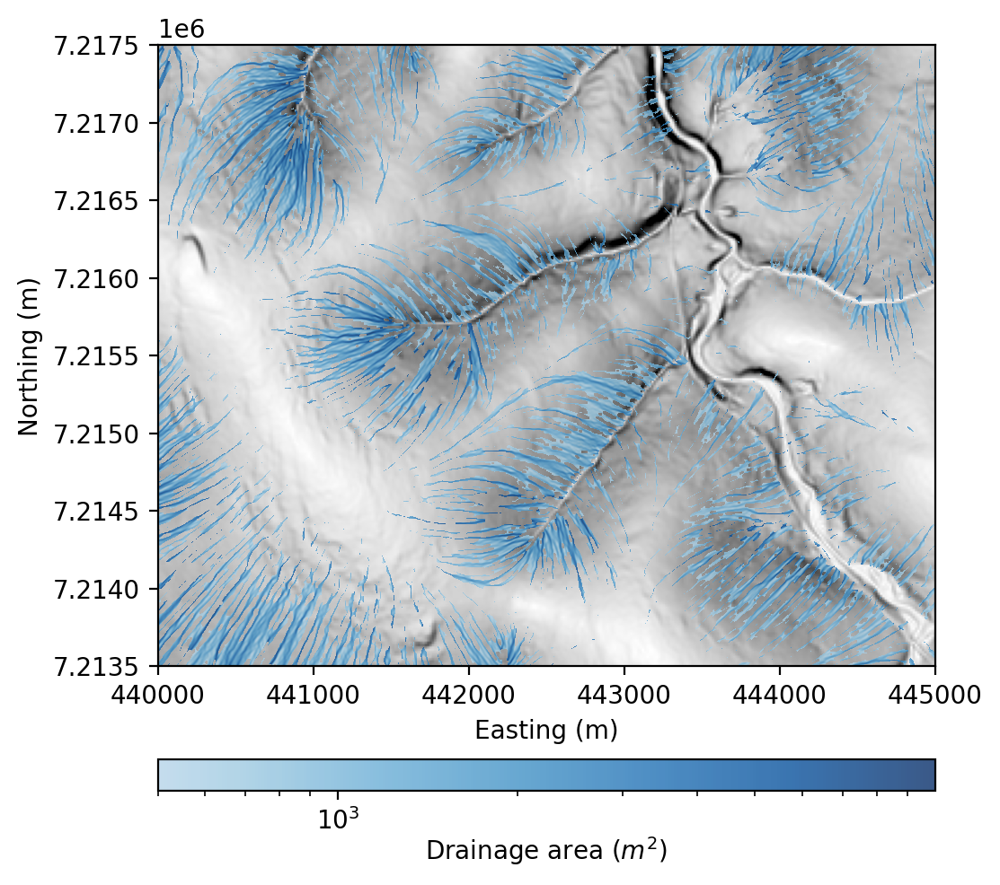

In [1271]:
extent=[curv.bounds[0], curv.bounds[2], curv.bounds[1], curv.bounds[3]]


fig, ax = plt.subplots(figsize=(7, 5.5),dpi=200)

slope = rasterio.plot.show(slopeshade, vmin=0.0, vmax=0.4, cmap='binary',  ax=ax, zorder=0) 
#im0 = ax.imshow(curv_mask, extent=extent, cmap='bwr_r', alpha=0.6, zorder=1)

im1 = ax.imshow(dinf_mask, extent=extent, norm=colors.LogNorm(), cmap=new_Blues, alpha=0.8, zorder=2)

#im2 = ax.imshow(curv_dinf_masked, extent=extent, cmap='bwr_r', alpha=0.6, zorder=3)

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("bottom", size="5%", pad="15%")
cb = fig.colorbar(im1, cax=cax, orientation='horizontal')
cb.set_label('Drainage area ($m^{{{2}}}$)', labelpad=0)
#cb.ax.tick_params(labelsize=6) 

ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')

#fig.tight_layout()
ax.set_ylim((7.2135e6, 7.2175e6))
ax.set_xlim((440000, 445000))

plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','dinf_zoom.png')))

In [1253]:
disp = rasterio.open(os.path.join(data_directory, 'insar_displacement.tif'))
disp_read = curv.read(1, masked=True)

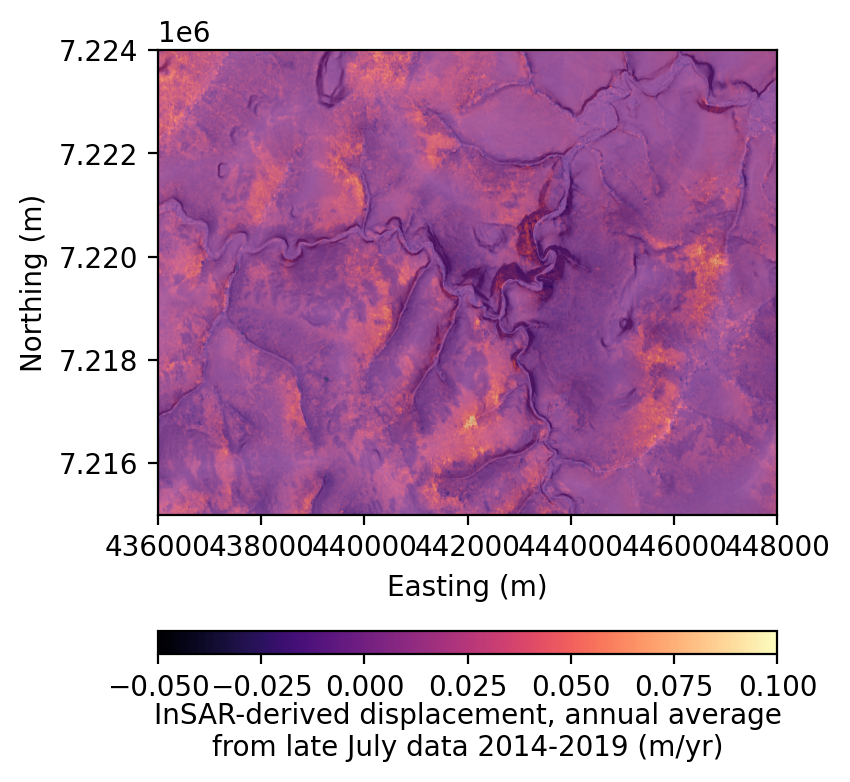

In [1309]:
fig, ax = plt.subplots(figsize=(8, 4),dpi=200)

insar0 = ax.imshow(disp_read, cmap='magma',  vmin=-0.05, vmax=0.1, zorder=0) 
slope = rasterio.plot.show(slopeshade, extent=extent,vmin=0.0, vmax=0.4, cmap='binary',  ax=ax, zorder=0) 
insar = rasterio.plot.show(disp, extent=extent,cmap='magma', vmin=-0.05, vmax=0.1, alpha=0.75, ax=ax, zorder=1) 

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("bottom", size="5%", pad="25%")
cb = fig.colorbar(insar0, cax=cax, orientation='horizontal')
cb.set_label('InSAR-derived displacement, annual average\nfrom late July data 2014-2019 (m/yr)', labelpad=0)

ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')

#fig.tight_layout()
ax.set_ylim((7.215e6, 7.224e6))
ax.set_xlim((436000, 448000))
plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','disp_medzoom.png')))

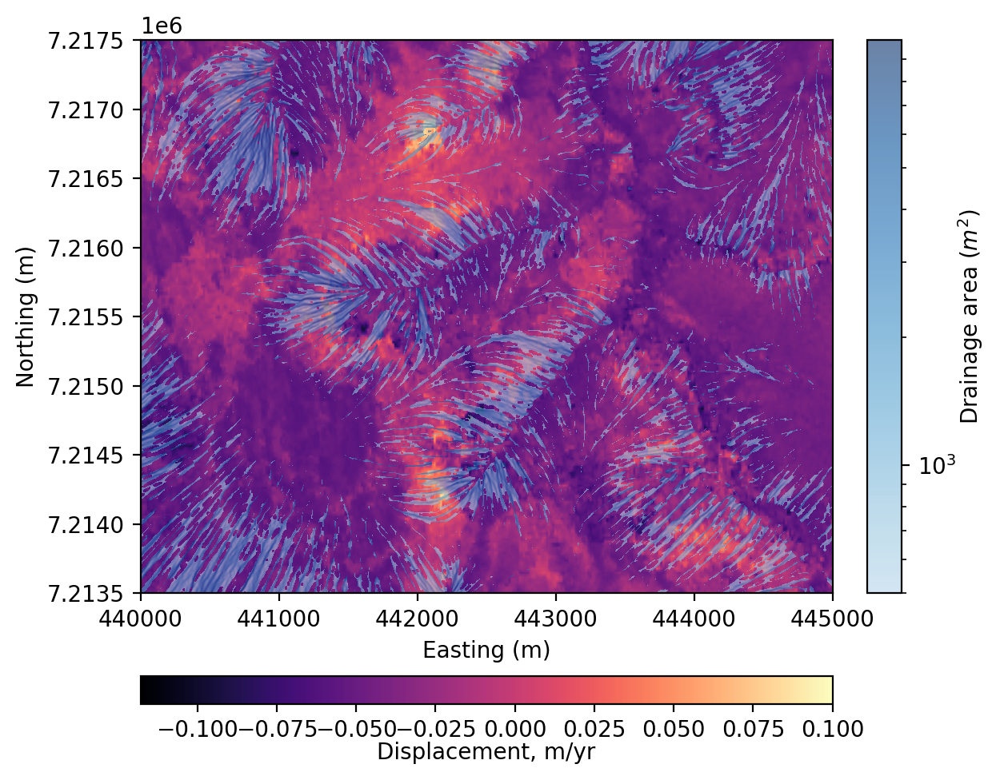

In [1275]:
fig, ax = plt.subplots(figsize=(7, 5.5),dpi=200)

insar0 = ax.imshow(disp_read, cmap='magma', vmax=0.1, zorder=0) 
insar = rasterio.plot.show(disp, cmap='magma', vmax=0.1, ax=ax, zorder=1) 
im1 = ax.imshow(dinf_mask, extent=extent, norm=colors.LogNorm(), cmap=new_Blues, alpha=0.6, zorder=2)

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("bottom", size="5%", pad="15%")
cb = fig.colorbar(insar0, cax=cax, orientation='horizontal')
cb.set_label('Displacement, m/yr', labelpad=0)

cax2 = divider.append_axes("right", size="5%", pad="5%")
cb2 = fig.colorbar(im1, cax=cax2, orientation='vertical')
cb2.set_label('Drainage area ($m^{{{2}}}$)', labelpad=0)


ax.set_xlabel('Easting (m)')
ax.set_ylabel('Northing (m)')

#fig.tight_layout()
ax.set_ylim((7.2135e6, 7.2175e6))
ax.set_xlim((440000, 445000))
plt.savefig((os.path.join('//dartfs/rc/lab/V/VecchioJ/Seward_Morphometry/SM_figure_outputs/','disp_dinf.png')))

# Old

In [ ]:
df = df_new
slope_array = np.arange(0, 0.9, 0.01)

#Bins for area
a1=10.**(np.arange(0, 7)) 
a2 = np.arange(1,10,1)
da_array=np.outer(a1, a2).flatten()
#curvature ranges from -0.034 to 0.042

df['bin_dinf'] = pd.cut(df['Dinf'],bins=da_array,
                        labels=range(len(da_array)-1)
                        #labels=da_array[:-1]
                             )
df['bin_slope'] = pd.cut(df['Slope'],bins=slope_array, 
                         labels=range(len(slope_array)-1)
                         #labels=curve_array[:-1]
                              )
df_out = df.groupby(['bin_slope','bin_dinf'])['NDVI max']

arr = df_out.mean().sort_index().values.reshape(len(slope_array)-1,len(da_array)-1)
#Y axis is rows in reshape (first value in reshape)

counts = df_out.count().sort_index().values.reshape(len(slope_array)-1,len(da_array)-1)
#counts[counts > 10000] = 10000``
#arr_alpha = counts/counts.max()
#arr_alpha[arr_alpha < 0.2] = 0.2

arr[counts < 10] = np.nan

import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize=(3,3),dpi=200)

#OK, extent means nothing lol

im = ax.imshow(arr*100.0, cmap='Greens', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(curve_array), np.max(curve_array)],
            extent=[0, len(da_array)-1, np.min(slope_array), np.max(slope_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#               alpha=arr_alpha,
#                norm=colors.LogNorm(),
               origin='lower')


# im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',
# #               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
# #               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#                alpha=0.75,
#                 norm=colors.LogNorm(),
#                    linewidths=0.5,
#                origin='lower')


plt.xticks(ticks=[0, 9, 18, 27, 36, 45, 54], labels=da_array[::9], rotation='vertical')

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("right", size="5%", pad="2%")
cb = fig.colorbar(im, cax=cax)
cb.set_label('NDVI max', rotation=270, labelpad=20);

#ax.clabel(im2, im2.levels, inline=True, fontsize=6)
#ax.set_xscale('log')
#ax.set_xlim(1e4)
ax.set_ylabel('Slope')
ax.set_xlabel('Drainage area (m^2)')
#ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2e'))
#https://stackoverflow.com/questions/25750170/show-decimal-places-and-scientific-notation-on-the-axis-of-a-matplotlib-plot/49330649#49330649
#cb.mappable.set_clim(0.0, 1.5)
#https://stackoverflow.com/questions/69435068/change-colorbar-limit-for-changing-scale-with-matplotlib-3-3

Text(0.5, 0, 'Drainage area (m^2)')

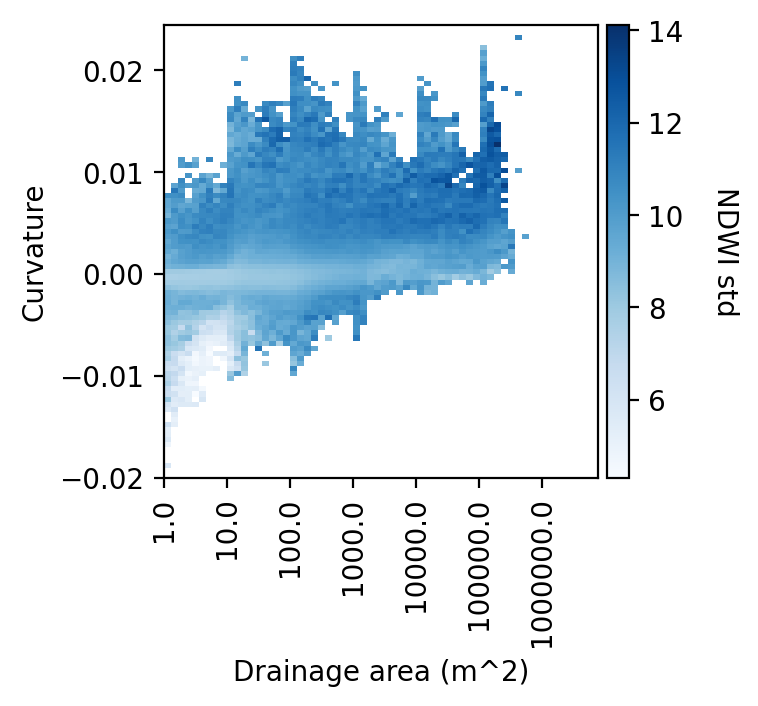

In [63]:
df = df_new
curve_array = np.arange(-0.02, 0.025, 0.0005)

#Bins for area
a1=10.**(np.arange(0, 7)) 
a2 = np.arange(1,10,1)
da_array=np.outer(a1, a2).flatten()
#curvature ranges from -0.034 to 0.042

df['bin_dinf'] = pd.cut(df['Dinf'],bins=da_array,
                        labels=range(len(da_array)-1)
                        #labels=da_array[:-1]
                             )
df['bin_curve'] = pd.cut(df['Curv'],bins=curve_array, 
                         labels=range(len(curve_array)-1)
                         #labels=curve_array[:-1]
                              )
df_out = df.groupby(['bin_curve','bin_dinf'])['NDWI std']

arr = df_out.mean().sort_index().values.reshape(len(curve_array)-1,len(da_array)-1)
#Y axis is rows in reshape (first value in reshape)

counts = df_out.count().sort_index().values.reshape(len(curve_array)-1,len(da_array)-1)
#counts[counts > 10000] = 10000``
#arr_alpha = counts/counts.max()
#arr_alpha[arr_alpha < 0.2] = 0.2

arr[counts < 10] = np.nan

import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize=(3,3),dpi=200)

#OK, extent means nothing lol

im = ax.imshow(arr*100.0, cmap='Blues', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(curve_array), np.max(curve_array)],
            extent=[0, len(da_array)-1, np.min(curve_array), np.max(curve_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#               alpha=arr_alpha,
#                norm=colors.LogNorm(),
               origin='lower')


# im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',
# #               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
# #               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#                alpha=0.75,
#                 norm=colors.LogNorm(),
#                    linewidths=0.5,
#                origin='lower')


plt.xticks(ticks=[0, 9, 18, 27, 36, 45, 54], labels=da_array[::9], rotation='vertical')

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("right", size="5%", pad="2%")
cb = fig.colorbar(im, cax=cax)
cb.set_label('NDWI std', rotation=270, labelpad=20);

#ax.clabel(im2, im2.levels, inline=True, fontsize=6)
#ax.set_xscale('log')
#ax.set_xlim(1e4)
ax.set_ylabel('Curvature')
ax.set_xlabel('Drainage area (m^2)')
#ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2e'))
#https://stackoverflow.com/questions/25750170/show-decimal-places-and-scientific-notation-on-the-axis-of-a-matplotlib-plot/49330649#49330649
#cb.mappable.set_clim(0.0, 1.5)
#https://stackoverflow.com/questions/69435068/change-colorbar-limit-for-changing-scale-with-matplotlib-3-3

Text(0.5, 0, 'Drainage area (m^2)')

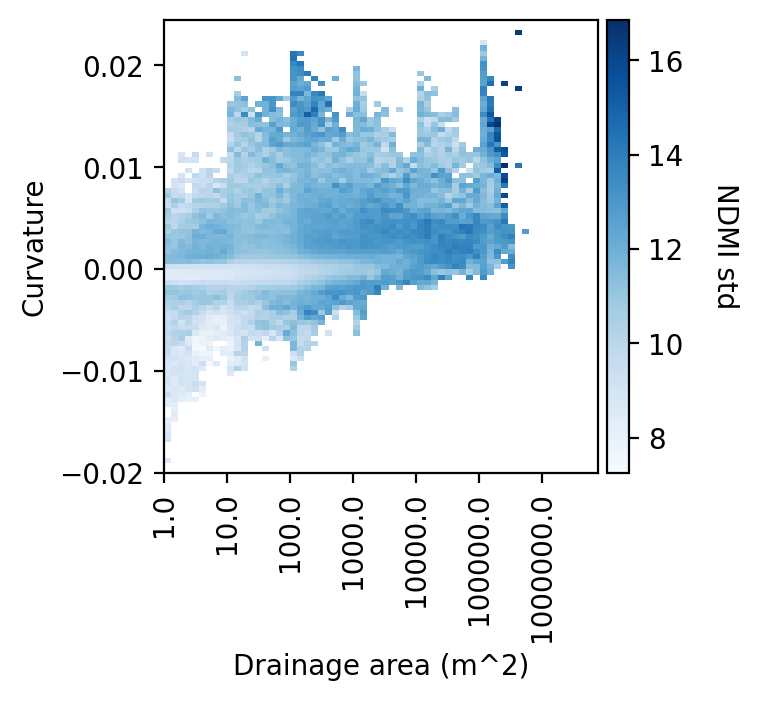

In [64]:
df = df_new
curve_array = np.arange(-0.02, 0.025, 0.0005)

#Bins for area
a1=10.**(np.arange(0, 7)) 
a2 = np.arange(1,10,1)
da_array=np.outer(a1, a2).flatten()
#curvature ranges from -0.034 to 0.042

df['bin_dinf'] = pd.cut(df['Dinf'],bins=da_array,
                        labels=range(len(da_array)-1)
                        #labels=da_array[:-1]
                             )
df['bin_curve'] = pd.cut(df['Curv'],bins=curve_array, 
                         labels=range(len(curve_array)-1)
                         #labels=curve_array[:-1]
                              )
df_out = df.groupby(['bin_curve','bin_dinf'])['NDMI std']

arr = df_out.mean().sort_index().values.reshape(len(curve_array)-1,len(da_array)-1)
#Y axis is rows in reshape (first value in reshape)

counts = df_out.count().sort_index().values.reshape(len(curve_array)-1,len(da_array)-1)
#counts[counts > 10000] = 10000``
#arr_alpha = counts/counts.max()
#arr_alpha[arr_alpha < 0.2] = 0.2

arr[counts < 10] = np.nan

import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize=(3,3),dpi=200)

#OK, extent means nothing lol

im = ax.imshow(arr*100.0, cmap='Blues', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(curve_array), np.max(curve_array)],
            extent=[0, len(da_array)-1, np.min(curve_array), np.max(curve_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#               alpha=arr_alpha,
#                norm=colors.LogNorm(),
               origin='lower')


# im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',
# #               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
# #               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#                alpha=0.75,
#                 norm=colors.LogNorm(),
#                    linewidths=0.5,
#                origin='lower')


plt.xticks(ticks=[0, 9, 18, 27, 36, 45, 54], labels=da_array[::9], rotation='vertical')

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("right", size="5%", pad="2%")
cb = fig.colorbar(im, cax=cax)
cb.set_label('NDMI std', rotation=270, labelpad=20);

#ax.clabel(im2, im2.levels, inline=True, fontsize=6)
#ax.set_xscale('log')
#ax.set_xlim(1e4)
ax.set_ylabel('Curvature')
ax.set_xlabel('Drainage area (m^2)')
#ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2e'))
#https://stackoverflow.com/questions/25750170/show-decimal-places-and-scientific-notation-on-the-axis-of-a-matplotlib-plot/49330649#49330649
#cb.mappable.set_clim(0.0, 1.5)
#https://stackoverflow.com/questions/69435068/change-colorbar-limit-for-changing-scale-with-matplotlib-3-3

Text(0.5, 0, 'Drainage area (m^2)')

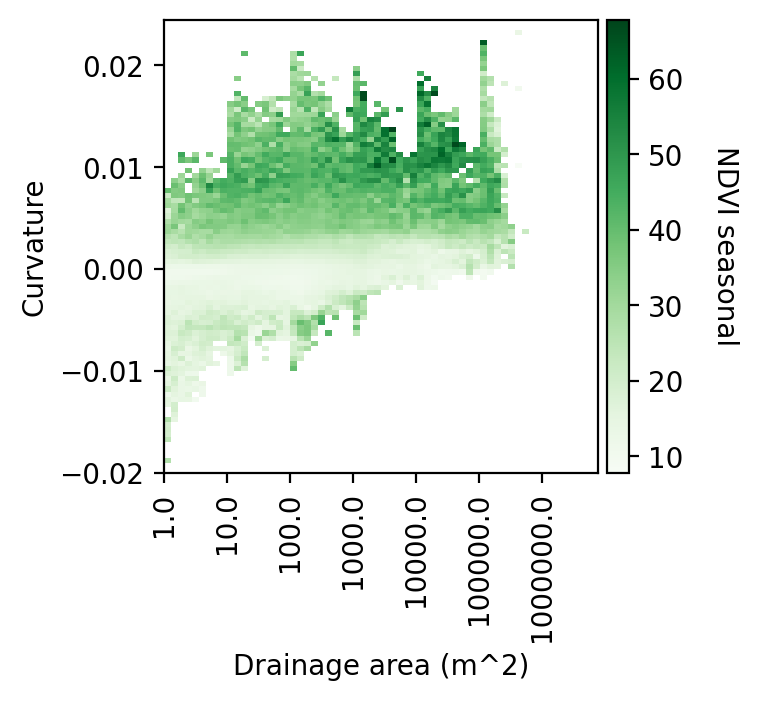

In [70]:
df = df_new
curve_array = np.arange(-0.02, 0.025, 0.0005)

#Bins for area
a1=10.**(np.arange(0, 7)) 
a2 = np.arange(1,10,1)
da_array=np.outer(a1, a2).flatten()
#curvature ranges from -0.034 to 0.042

df['bin_dinf'] = pd.cut(df['Dinf'],bins=da_array,
                        labels=range(len(da_array)-1)
                        #labels=da_array[:-1]
                             )
df['bin_curve'] = pd.cut(df['Curv'],bins=curve_array, 
                         labels=range(len(curve_array)-1)
                         #labels=curve_array[:-1]
                              )
df_out = df.groupby(['bin_curve','bin_dinf'])['NDVI seasonal']

arr = df_out.mean().sort_index().values.reshape(len(curve_array)-1,len(da_array)-1)
#Y axis is rows in reshape (first value in reshape)

counts = df_out.count().sort_index().values.reshape(len(curve_array)-1,len(da_array)-1)
#counts[counts > 10000] = 10000``
#arr_alpha = counts/counts.max()
#arr_alpha[arr_alpha < 0.2] = 0.2

arr[counts < 10] = np.nan

import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize=(3,3),dpi=200)

#OK, extent means nothing lol

im = ax.imshow(arr*100.0, cmap='Greens', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(curve_array), np.max(curve_array)],
            extent=[0, len(da_array)-1, np.min(curve_array), np.max(curve_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#               alpha=arr_alpha,
#                norm=colors.LogNorm(),
               origin='lower')


# im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',
# #               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
# #               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#                alpha=0.75,
#                 norm=colors.LogNorm(),
#                    linewidths=0.5,
#                origin='lower')


plt.xticks(ticks=[0, 9, 18, 27, 36, 45, 54], labels=da_array[::9], rotation='vertical')

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("right", size="5%", pad="2%")
cb = fig.colorbar(im, cax=cax)
cb.set_label('NDVI seasonal', rotation=270, labelpad=20);

#ax.clabel(im2, im2.levels, inline=True, fontsize=6)
#ax.set_xscale('log')
#ax.set_xlim(1e4)
ax.set_ylabel('Curvature')
ax.set_xlabel('Drainage area (m^2)')
#ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2e'))
#https://stackoverflow.com/questions/25750170/show-decimal-places-and-scientific-notation-on-the-axis-of-a-matplotlib-plot/49330649#49330649
#cb.mappable.set_clim(0.0, 1.5)
#https://stackoverflow.com/questions/69435068/change-colorbar-limit-for-changing-scale-with-matplotlib-3-3

Text(0.5, 0, 'Drainage area (m^2)')

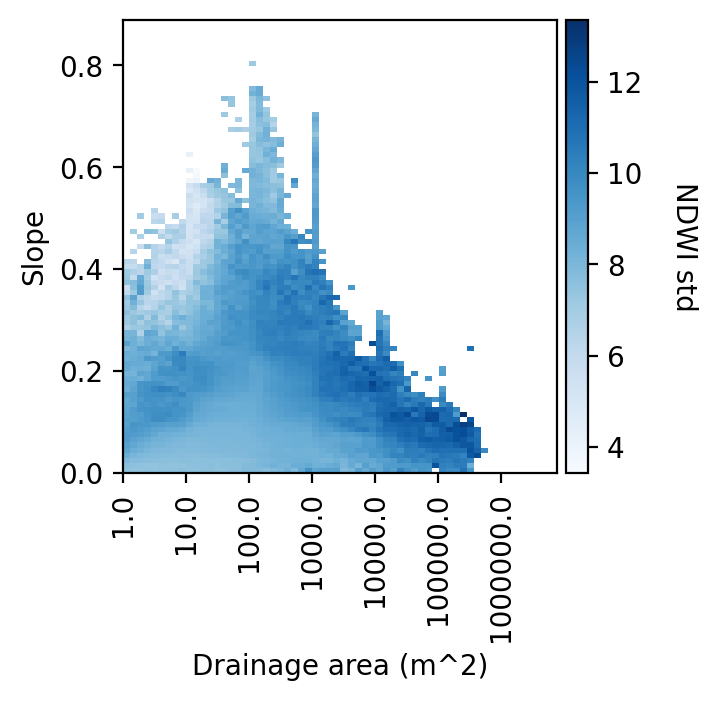

In [66]:
df = df_new
slope_array = np.arange(0, 0.9, 0.01)

#Bins for area
a1=10.**(np.arange(0, 7)) 
a2 = np.arange(1,10,1)
da_array=np.outer(a1, a2).flatten()
#curvature ranges from -0.034 to 0.042

df['bin_dinf'] = pd.cut(df['Dinf'],bins=da_array,
                        labels=range(len(da_array)-1)
                        #labels=da_array[:-1]
                             )
df['bin_slope'] = pd.cut(df['Slope'],bins=slope_array, 
                         labels=range(len(slope_array)-1)
                         #labels=curve_array[:-1]
                              )
df_out = df.groupby(['bin_slope','bin_dinf'])['NDWI std']

arr = df_out.mean().sort_index().values.reshape(len(slope_array)-1,len(da_array)-1)
#Y axis is rows in reshape (first value in reshape)

counts = df_out.count().sort_index().values.reshape(len(slope_array)-1,len(da_array)-1)
#counts[counts > 10000] = 10000``
#arr_alpha = counts/counts.max()
#arr_alpha[arr_alpha < 0.2] = 0.2

arr[counts < 10] = np.nan

import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize=(3,3),dpi=200)

#OK, extent means nothing lol

im = ax.imshow(arr*100.0, cmap='Blues', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(curve_array), np.max(curve_array)],
            extent=[0, len(da_array)-1, np.min(slope_array), np.max(slope_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#               alpha=arr_alpha,
#                norm=colors.LogNorm(),
               origin='lower')


# im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',
# #               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
# #               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#                alpha=0.75,
#                 norm=colors.LogNorm(),
#                    linewidths=0.5,
#                origin='lower')


plt.xticks(ticks=[0, 9, 18, 27, 36, 45, 54], labels=da_array[::9], rotation='vertical')

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("right", size="5%", pad="2%")
cb = fig.colorbar(im, cax=cax)
cb.set_label('NDWI std', rotation=270, labelpad=20);

#ax.clabel(im2, im2.levels, inline=True, fontsize=6)
#ax.set_xscale('log')
#ax.set_xlim(1e4)
ax.set_ylabel('Slope')
ax.set_xlabel('Drainage area (m^2)')
#ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2e'))
#https://stackoverflow.com/questions/25750170/show-decimal-places-and-scientific-notation-on-the-axis-of-a-matplotlib-plot/49330649#49330649
#cb.mappable.set_clim(0.0, 1.5)
#https://stackoverflow.com/questions/69435068/change-colorbar-limit-for-changing-scale-with-matplotlib-3-3

Text(0.5, 0, 'Drainage area (m^2)')

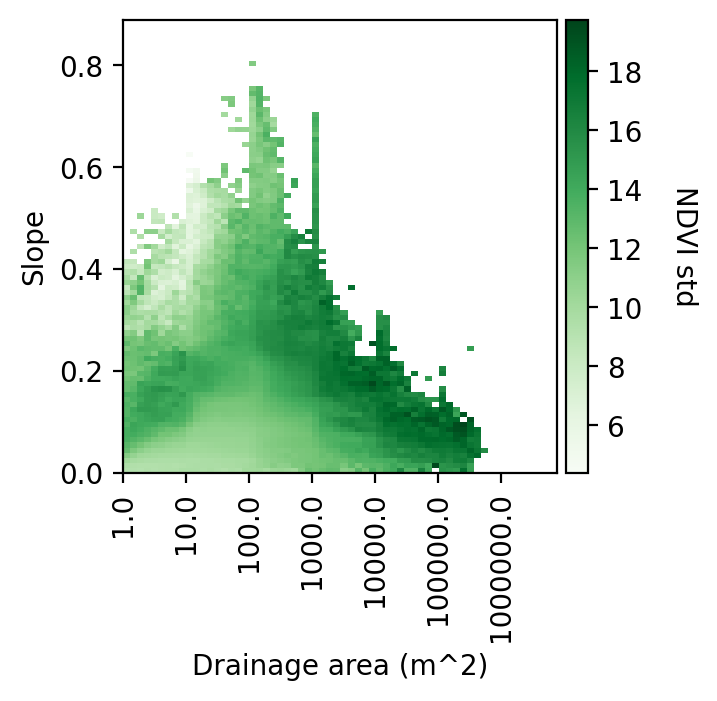

In [69]:
df = df_new
slope_array = np.arange(0, 0.9, 0.01)

#Bins for area
a1=10.**(np.arange(0, 7)) 
a2 = np.arange(1,10,1)
da_array=np.outer(a1, a2).flatten()
#curvature ranges from -0.034 to 0.042

df['bin_dinf'] = pd.cut(df['Dinf'],bins=da_array,
                        labels=range(len(da_array)-1)
                        #labels=da_array[:-1]
                             )
df['bin_slope'] = pd.cut(df['Slope'],bins=slope_array, 
                         labels=range(len(slope_array)-1)
                         #labels=curve_array[:-1]
                              )
df_out = df.groupby(['bin_slope','bin_dinf'])['NDVI std']

arr = df_out.mean().sort_index().values.reshape(len(slope_array)-1,len(da_array)-1)
#Y axis is rows in reshape (first value in reshape)

counts = df_out.count().sort_index().values.reshape(len(slope_array)-1,len(da_array)-1)
#counts[counts > 10000] = 10000``
#arr_alpha = counts/counts.max()
#arr_alpha[arr_alpha < 0.2] = 0.2

arr[counts < 10] = np.nan

import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize=(3,3),dpi=200)

#OK, extent means nothing lol

im = ax.imshow(arr*100.0, cmap='Greens', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(curve_array), np.max(curve_array)],
            extent=[0, len(da_array)-1, np.min(slope_array), np.max(slope_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#               alpha=arr_alpha,
#                norm=colors.LogNorm(),
               origin='lower')


# im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',
# #               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
# #               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#                alpha=0.75,
#                 norm=colors.LogNorm(),
#                    linewidths=0.5,
#                origin='lower')


plt.xticks(ticks=[0, 9, 18, 27, 36, 45, 54], labels=da_array[::9], rotation='vertical')

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("right", size="5%", pad="2%")
cb = fig.colorbar(im, cax=cax)
cb.set_label('NDVI std', rotation=270, labelpad=20);

#ax.clabel(im2, im2.levels, inline=True, fontsize=6)
#ax.set_xscale('log')
#ax.set_xlim(1e4)
ax.set_ylabel('Slope')
ax.set_xlabel('Drainage area (m^2)')
#ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2e'))
#https://stackoverflow.com/questions/25750170/show-decimal-places-and-scientific-notation-on-the-axis-of-a-matplotlib-plot/49330649#49330649
#cb.mappable.set_clim(0.0, 1.5)
#https://stackoverflow.com/questions/69435068/change-colorbar-limit-for-changing-scale-with-matplotlib-3-3

Text(0.5, 0, 'Drainage area (m^2)')

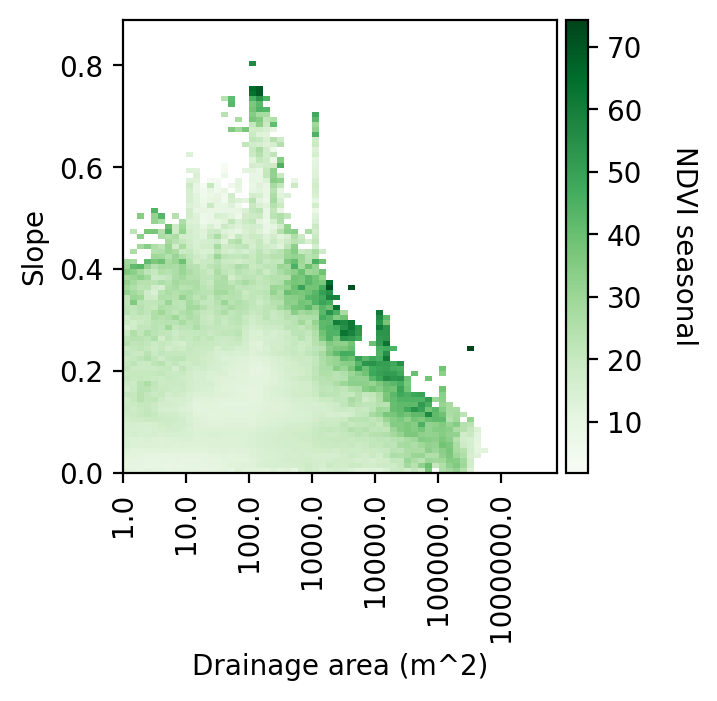

In [71]:
df = df_new
slope_array = np.arange(0, 0.9, 0.01)

#Bins for area
a1=10.**(np.arange(0, 7)) 
a2 = np.arange(1,10,1)
da_array=np.outer(a1, a2).flatten()
#curvature ranges from -0.034 to 0.042

df['bin_dinf'] = pd.cut(df['Dinf'],bins=da_array,
                        labels=range(len(da_array)-1)
                        #labels=da_array[:-1]
                             )
df['bin_slope'] = pd.cut(df['Slope'],bins=slope_array, 
                         labels=range(len(slope_array)-1)
                         #labels=curve_array[:-1]
                              )
df_out = df.groupby(['bin_slope','bin_dinf'])['NDVI seasonal']

arr = df_out.mean().sort_index().values.reshape(len(slope_array)-1,len(da_array)-1)
#Y axis is rows in reshape (first value in reshape)

counts = df_out.count().sort_index().values.reshape(len(slope_array)-1,len(da_array)-1)
#counts[counts > 10000] = 10000``
#arr_alpha = counts/counts.max()
#arr_alpha[arr_alpha < 0.2] = 0.2

arr[counts < 10] = np.nan

import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize=(3,3),dpi=200)

#OK, extent means nothing lol

im = ax.imshow(arr*100.0, cmap='Greens', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(curve_array), np.max(curve_array)],
            extent=[0, len(da_array)-1, np.min(slope_array), np.max(slope_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#               alpha=arr_alpha,
#                norm=colors.LogNorm(),
               origin='lower')


# im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',
# #               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
# #               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#                alpha=0.75,
#                 norm=colors.LogNorm(),
#                    linewidths=0.5,
#                origin='lower')


plt.xticks(ticks=[0, 9, 18, 27, 36, 45, 54], labels=da_array[::9], rotation='vertical')

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("right", size="5%", pad="2%")
cb = fig.colorbar(im, cax=cax)
cb.set_label('NDVI seasonal', rotation=270, labelpad=20);

#ax.clabel(im2, im2.levels, inline=True, fontsize=6)
#ax.set_xscale('log')
#ax.set_xlim(1e4)
ax.set_ylabel('Slope')
ax.set_xlabel('Drainage area (m^2)')
#ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2e'))
#https://stackoverflow.com/questions/25750170/show-decimal-places-and-scientific-notation-on-the-axis-of-a-matplotlib-plot/49330649#49330649
#cb.mappable.set_clim(0.0, 1.5)
#https://stackoverflow.com/questions/69435068/change-colorbar-limit-for-changing-scale-with-matplotlib-3-3

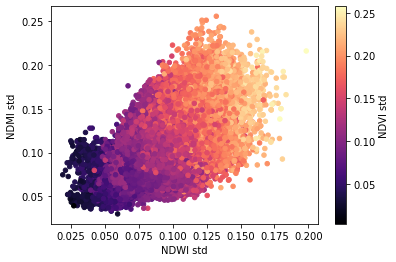

In [68]:
fig, ax = plt.subplots()
scatter = df[::100].plot.scatter(x='NDWI std',
                                 y='NDMI std',
                                 c='NDVI std',
                                 #alpha=0.05, 
                                 cmap='magma',
                                 ax=ax)

## Slope-area-displacement heatmap

In [13]:
df = pd.read_csv('basin_raster_sample_3.csv')
df.head()

,Unnamed: 0,y,x,junct,Elev,Slope,Dinf,Curv,Asp,Disp
0,3937172,7.220838e+06,445252.273593,230,178.66266,-9999.0,64,-3.0,-9999.0,-3.402823e+38
1,3948240,7.220836e+06,445254.273593,230,179.18849,-9999.0,87,-3.0,-9999.0,-3.402823e+38
2,3959308,7.220834e+06,445256.273593,230,179.68858,-9999.0,140,-3.0,-9999.0,-3.402823e+38
3,3970375,7.220832e+06,445256.273593,230,180.05418,-9999.0,21,-3.0,-9999.0,3.315873e-03
4,3970376,7.220832e+06,445258.273593,230,180.18137,-9999.0,240,-3.0,-9999.0,3.315873e-03


In [22]:
df.loc[df['Slope']< -100.0 ] = np.nan
df.loc[df['Curv']< -1.0 ] = np.nan
df = df.dropna()
df.head()


,Unnamed: 0,y,x,junct,Elev,Slope,Dinf,Curv,Asp,Disp,bin_dinf,bin_slope,bin_curve
70,4081055.0,7.220812e+06,445276.273593,230.0,186.23126,0.210004,2897.0,0.002861,332.085360,0.005324,28,21,45
71,4081056.0,7.220812e+06,445278.273593,230.0,186.44478,0.205620,5707.0,0.003116,327.074430,0.005324,31,20,46
72,4081769.0,7.220812e+06,446704.273593,125.0,145.31529,0.135999,18.0,-0.001728,69.832430,0.005069,9,13,36
73,4081770.0,7.220812e+06,446706.273593,125.0,145.04979,0.136533,19.0,-0.001738,71.875700,0.005069,9,13,36
74,4081771.0,7.220812e+06,446708.273593,125.0,144.77698,0.136308,19.0,-0.001717,74.467865,0.005810,9,13,36


In [ ]:
curve_array = np.arange(-0.02, 0.025, 0.0005)

#Bins for area
a1=10.**(np.arange(0, 7)) 
a2 = np.arange(1,10,1)
da_array=np.outer(a1, a2).flatten()
#curvature ranges from -0.034 to 0.042

df['bin_dinf'] = pd.cut(df['Dinf'],bins=da_array,
                        labels=range(len(da_array)-1)
                        #labels=da_array[:-1]
                             )
df['bin_curve'] = pd.cut(df['Curv'],bins=curve_array, 
                         labels=range(len(curve_array)-1)
                         #labels=curve_array[:-1]
                              )
df_out = df.groupby(['bin_curve','bin_dinf'])['Disp']

arr = df_out.mean().sort_index().values.reshape(len(curve_array)-1,len(da_array)-1)
#Y axis is rows in reshape (first value in reshape)

counts = df_out.count().sort_index().values.reshape(len(curve_array)-1,len(da_array)-1)
#counts[counts > 10000] = 10000``
#arr_alpha = counts/counts.max()
#arr_alpha[arr_alpha < 0.2] = 0.2

arr[counts < 10] = np.nan

import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize=(3,3),dpi=200)

#OK, extent means nothing lol

im = ax.imshow(arr*100.0, cmap='magma', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(curve_array), np.max(curve_array)],
            extent=[0, len(da_array)-1, np.min(curve_array), np.max(curve_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#               alpha=arr_alpha,
#                norm=colors.LogNorm(),
               origin='lower')


# im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',
# #               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
# #               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#                alpha=0.75,
#                 norm=colors.LogNorm(),
#                    linewidths=0.5,
#                origin='lower')


plt.xticks(ticks=[0, 9, 18, 27, 36, 45, 54], labels=da_array[::9], rotation='vertical')

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("right", size="5%", pad="2%")
cb = fig.colorbar(im, cax=cax)
cb.set_label('Average displacement, cm/yr', rotation=270, labelpad=20);

#ax.clabel(im2, im2.levels, inline=True, fontsize=6)
#ax.set_xscale('log')
#ax.set_xlim(1e4)
ax.set_ylabel('Curvature')
ax.set_xlabel('Drainage area (m^2)')
#ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2e'))
#https://stackoverflow.com/questions/25750170/show-decimal-places-and-scientific-notation-on-the-axis-of-a-matplotlib-plot/49330649#49330649
cb.mappable.set_clim(0.0, 1.5)
#https://stackoverflow.com/questions/69435068/change-colorbar-limit-for-changing-scale-with-matplotlib-3-3

### Slope heatmap

In [61]:
#Bins for area
a1=10.**(np.arange(0, 7)) 
a2 = np.arange(1,10,1)
da_array=np.outer(a1, a2).flatten()


slope_array = np.arange(0, 0.9, 0.01)
slope_array[20]

0.2

In [24]:
df['bin_dinf'] = pd.cut(df['Dinf'],bins=da_array,
                        labels=range(len(da_array)-1)
                        #labels=da_array[:-1]
                             )
df['bin_slope'] = pd.cut(df['Slope'],bins=slope_array, 
                         labels=range(len(slope_array)-1)
                         #labels=slope_array[:-1]
                              )
df_out = df.groupby(['bin_slope','bin_dinf'])['Disp']



/scratch/ipykernel_25500/3061525154.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['bin_dinf'] = pd.cut(df['Dinf'],bins=da_array,
/scratch/ipykernel_25500/3061525154.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['bin_slope'] = pd.cut(df['Slope'],bins=slope_array,


In [25]:
arr = df_out.mean().sort_index().values.reshape(len(slope_array)-1,len(da_array)-1)
#Y axis is rows in reshape (first value in reshape)

counts = df_out.count().sort_index().values.reshape(len(slope_array)-1,len(da_array)-1)
#counts[counts > 10000] = 10000``
#arr_alpha = counts/counts.max()
#arr_alpha[arr_alpha < 0.2] = 0.2

arr[counts < 10] = np.nan

/scratch/ipykernel_25500/2469936764.py:16: UserWarning: Log scale: values of z <= 0 have been masked
  im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',
/scratch/ipykernel_25500/2469936764.py:16: UserWarning: The following kwargs were not used by contour: 'interpolation', 'aspect'
  im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',


Text(0.5, 0, 'Drainage area (m^2)')

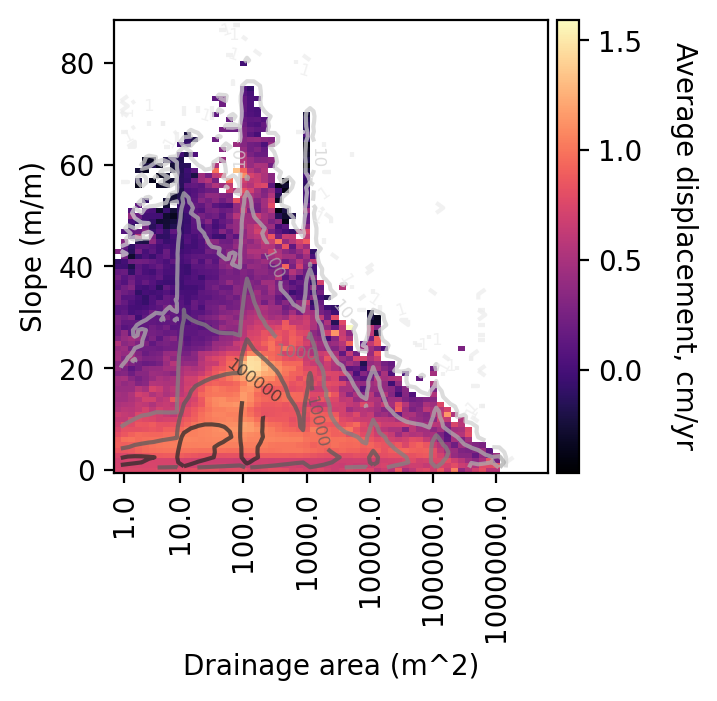

In [26]:
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from matplotlib import colors

fig, ax = plt.subplots(figsize=(3,3),dpi=200)

#OK, extent means nothing lol

im = ax.imshow(arr*100.0, cmap='magma', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#               alpha=arr_alpha,
#                norm=colors.LogNorm(),
               origin='lower')


im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
               alpha=0.75,
                norm=colors.LogNorm(),
               origin='lower')


plt.xticks(ticks=[1, 9, 18, 27, 36, 45, 54], labels=da_array[::9], rotation='vertical')

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("right", size="5%", pad="2%")
cb = fig.colorbar(im, cax=cax)
cb.set_label('Average displacement, cm/yr', rotation=270, labelpad=20);

ax.clabel(im2, im2.levels, inline=True, fontsize=6)
#ax.set_xscale('log')
#ax.set_xlim(1e4)
ax.set_ylabel('Slope (m/m)')
ax.set_xlabel('Drainage area (m^2)')

In [ ]:
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from matplotlib import colors

fig, ax = plt.subplots(figsize=(3,3),dpi=200)

#OK, extent means nothing lol

im = ax.imshow(arr*100.0, cmap='magma', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#               alpha=arr_alpha,
#                norm=colors.LogNorm(),
               origin='lower')


im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
               alpha=0.75,
                norm=colors.LogNorm(),
               origin='lower')


plt.xticks(ticks=[1, 9, 18, 27, 36, 45, 54], labels=da_array[::9], rotation='vertical')

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("right", size="5%", pad="2%")
cb = fig.colorbar(im, cax=cax)
cb.set_label('Average displacement, cm/yr', rotation=270, labelpad=20);

ax.clabel(im2, im2.levels, inline=True, fontsize=6)
#ax.set_xscale('log')
#ax.set_xlim(1e4)
ax.set_ylabel('Slope (m/m)')
ax.set_xlabel('Drainage area (m^2)')

### Curvature heatmap

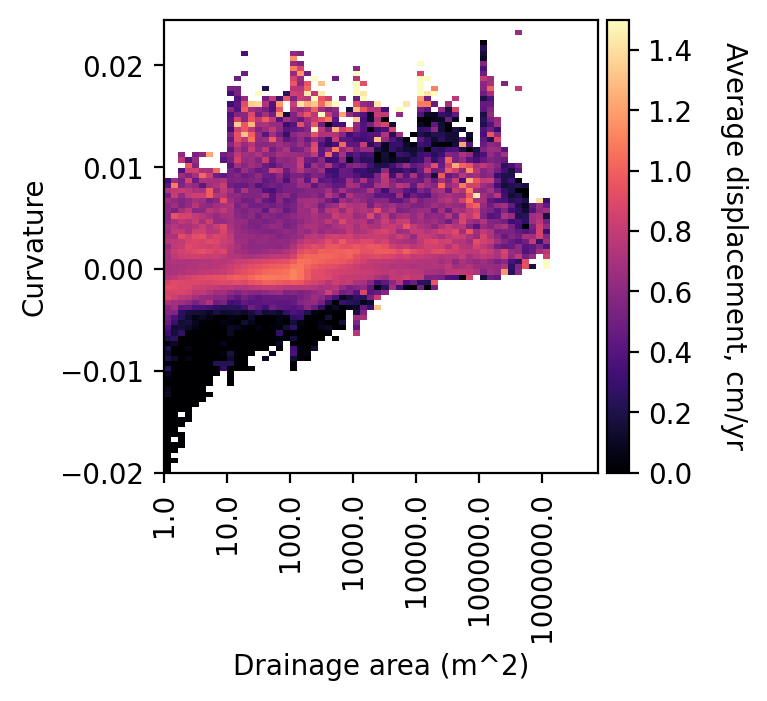

In [53]:
curve_array = np.arange(-0.02, 0.025, 0.0005)

#Bins for area
a1=10.**(np.arange(0, 7)) 
a2 = np.arange(1,10,1)
da_array=np.outer(a1, a2).flatten()
#curvature ranges from -0.034 to 0.042

df['bin_dinf'] = pd.cut(df['Dinf'],bins=da_array,
                        labels=range(len(da_array)-1)
                        #labels=da_array[:-1]
                             )
df['bin_curve'] = pd.cut(df['Curv'],bins=curve_array, 
                         labels=range(len(curve_array)-1)
                         #labels=curve_array[:-1]
                              )
df_out = df.groupby(['bin_curve','bin_dinf'])['Disp']

arr = df_out.mean().sort_index().values.reshape(len(curve_array)-1,len(da_array)-1)
#Y axis is rows in reshape (first value in reshape)

counts = df_out.count().sort_index().values.reshape(len(curve_array)-1,len(da_array)-1)
#counts[counts > 10000] = 10000``
#arr_alpha = counts/counts.max()
#arr_alpha[arr_alpha < 0.2] = 0.2

arr[counts < 10] = np.nan

import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize=(3,3),dpi=200)

#OK, extent means nothing lol

im = ax.imshow(arr*100.0, cmap='magma', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(curve_array), np.max(curve_array)],
            extent=[0, len(da_array)-1, np.min(curve_array), np.max(curve_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#               alpha=arr_alpha,
#                norm=colors.LogNorm(),
               origin='lower')


# im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',
# #               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
# #               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#                alpha=0.75,
#                 norm=colors.LogNorm(),
#                    linewidths=0.5,
#                origin='lower')


plt.xticks(ticks=[0, 9, 18, 27, 36, 45, 54], labels=da_array[::9], rotation='vertical')

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("right", size="5%", pad="2%")
cb = fig.colorbar(im, cax=cax)
cb.set_label('Average displacement, cm/yr', rotation=270, labelpad=20);

#ax.clabel(im2, im2.levels, inline=True, fontsize=6)
#ax.set_xscale('log')
#ax.set_xlim(1e4)
ax.set_ylabel('Curvature')
ax.set_xlabel('Drainage area (m^2)')
#ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2e'))
#https://stackoverflow.com/questions/25750170/show-decimal-places-and-scientific-notation-on-the-axis-of-a-matplotlib-plot/49330649#49330649
cb.mappable.set_clim(0.0, 1.5)
#https://stackoverflow.com/questions/69435068/change-colorbar-limit-for-changing-scale-with-matplotlib-3-3

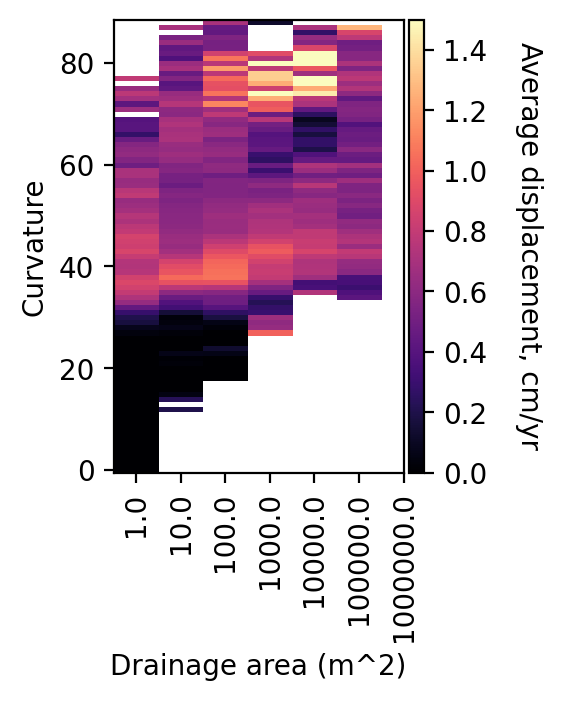

In [60]:
curve_array = np.arange(-0.02, 0.025, 0.0005)

#Bins for area
a1=10.**(np.arange(0, 7)) 
a2 = np.arange(1,10,1)
da_array=a1
#curvature ranges from -0.034 to 0.042

df['bin_dinf'] = pd.cut(df['Dinf'],bins=da_array,
                        labels=range(len(da_array)-1)
                        #labels=da_array[:-1]
                             )
df['bin_curve'] = pd.cut(df['Curv'],bins=curve_array, 
                         labels=range(len(curve_array)-1)
                         #labels=curve_array[:-1]
                              )
df_out = df.groupby(['bin_curve','bin_dinf'])['Disp']

arr = df_out.mean().sort_index().values.reshape(len(curve_array)-1,len(da_array)-1)
#Y axis is rows in reshape (first value in reshape)

counts = df_out.count().sort_index().values.reshape(len(curve_array)-1,len(da_array)-1)
#counts[counts > 10000] = 10000``
#arr_alpha = counts/counts.max()
#arr_alpha[arr_alpha < 0.2] = 0.2

arr[counts < 10] = np.nan

import matplotlib.ticker as mtick

fig, ax = plt.subplots(figsize=(2,3),dpi=200)

#OK, extent means nothing lol

im = ax.imshow(arr*100.0, cmap='magma', interpolation='none', aspect='auto',
#               extent=[np.min(da_array), np.max(da_array), np.min(curve_array), np.max(curve_array)],
#            extent=[0, len(da_array)-1, np.min(curve_array), np.max(curve_array)],
#               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#               alpha=arr_alpha,
#                norm=colors.LogNorm(),
               origin='lower')


# im2 = ax.contour(counts, cmap='Greys', interpolation='none', aspect='auto',
# #               extent=[np.min(da_array), np.max(da_array), np.min(slope_array), np.max(slope_array)],
# #               extent=[0, len(da_array)-1, 0, len(slope_array)-1],
#                alpha=0.75,
#                 norm=colors.LogNorm(),
#                    linewidths=0.5,
#                origin='lower')


plt.xticks(ticks=range(len(a1)), labels=da_array, rotation='vertical')

divider = make_axes_locatable(ax)
# Add an axes to the right of the main axes.
cax = divider.append_axes("right", size="5%", pad="2%")
cb = fig.colorbar(im, cax=cax)
cb.set_label('Average displacement, cm/yr', rotation=270, labelpad=20);

#ax.clabel(im2, im2.levels, inline=True, fontsize=6)
#ax.set_xscale('log')
#ax.set_xlim(1e4)
ax.set_ylabel('Curvature')
ax.set_xlabel('Drainage area (m^2)')
#ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2e'))
#https://stackoverflow.com/questions/25750170/show-decimal-places-and-scientific-notation-on-the-axis-of-a-matplotlib-plot/49330649#49330649
cb.mappable.set_clim(0.0, 1.5)
#https://stackoverflow.com/questions/69435068/change-colorbar-limit-for-changing-scale-with-matplotlib-3-3

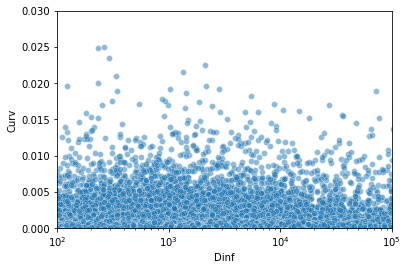

In [19]:
fig, ax = plt.subplots()
sns.scatterplot(data=df.iloc[::100, :], x='Dinf', y='Curv', alpha=0.5, ax=ax, legend=False)
ax.set_xlim(100,100000)
ax.set_ylim(0.0, 0.03)
ax.set_xscale('log')

In [29]:
mean_stat = binned_statistic(df['Dinf'],df['Curv'],
                            statistic='mean',
                            bins=da_array)

max_stat = binned_statistic(df['Dinf'],df['Curv'],
                            statistic='max',
                            bins=da_array)
# min_stat = binned_statistic(df['Dinf'],df['Curv'],
#                             statistic='min',
#                             bins=da_array)

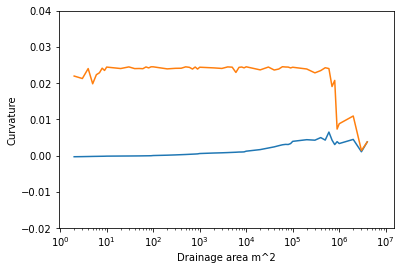

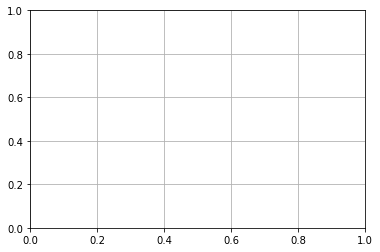

In [30]:
fig, ax = plt.subplots()

plt.plot(mean_stat.bin_edges[:-1],mean_stat.statistic)
plt.plot(max_stat.bin_edges[:-1],max_stat.statistic)
#plt.errorbar(mean_stat.bin_edges[1:],mean_stat.statistic,yerr=std_stat.statistic,fmt='o')
plt.xlabel('Drainage area m^2')
plt.ylabel('Curvature')
plt.xscale('log')
plt.ylim(-0.02, 0.04)
plt.show()
plt.grid()

In [20]:
cts_stat = binned_statistic(df['Dinf'],df['Curv'],
                            statistic='count',
                            bins=da_array)

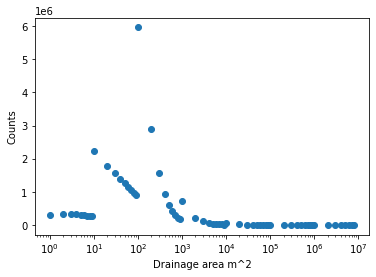

In [21]:
plt.scatter(cts_stat.bin_edges[:-1],cts_stat.statistic)
#plt.errorbar(mean_stat.bin_edges[1:],mean_stat.statistic,yerr=std_stat.statistic,fmt='o')
plt.xlabel('Drainage area m^2')
plt.ylabel('Counts')
plt.xscale('log')
plt.show()

(500000.0, 4000000.0)

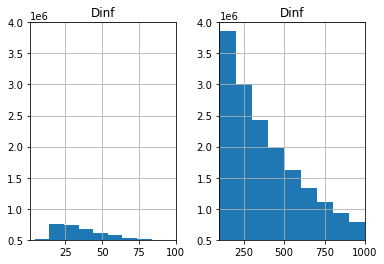

In [54]:
fig, ax = plt.subplots(1,2)
hist = df.loc[df['Dinf'] < 1000].hist(column='Dinf', ax=ax[0], bins=100)
ax[0].set_xlim(1,100)
ax[0].set_ylim(5e5,4e6)

hist = df.loc[df['Dinf'] < 1000].hist(column='Dinf', ax=ax[1])
ax[1].set_xlim(100,1000)
ax[1].set_ylim(5e5,4e6)



### alternative

In [23]:
import rioxarray
from rioxarray import merge
import xarray
disp = rioxarray.open_rasterio(os.path.join(data_directory, 'seward_hsp_insar.tif'))

elev = rioxarray.open_rasterio(os.path.join(data_directory, 'seward_hsp_elev.tif'))
curv = rioxarray.open_rasterio(os.path.join(data_directory, 'curv_LW.tif'))
asp = rioxarray.open_rasterio(os.path.join(data_directory, 'seward_hsp_aspect.tif'))
dinf = rioxarray.open_rasterio(os.path.join(data_directory, 'seward_hsp__dinf_area.tif'))
basins = rioxarray.open_rasterio(os.path.join(data_directory, 'hcc_AllBasins.tif'))



In [13]:
import importlib.util
import sys

# For illustrative purposes.
name = 'xarray'

if name in sys.modules:
    print(f"{name!r} already in sys.modules")
elif (spec := importlib.util.find_spec(name)) is not None:
    # If you choose to perform the actual import ...
    module = importlib.util.module_from_spec(spec)
    sys.modules[name] = module
    spec.loader.exec_module(module)
    print(f"{name!r} has been imported")
else:
    print(f"can't find the {name!r} module")

'xarray' already in sys.modules


In [9]:
import sys
!conda install xarray-spatial --yes
from xrspatial import zonal_stats

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.10.1
  latest version: 4.10.3

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /dartfs-hpc/rc/home/1/f005dv1/.conda/envs/geopandas

  added / updated specs:
    - xarray-spatial


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    arrow-cpp-5.0.0            |py39h247a7eb_8_cpu        23.2 MB  conda-forge
    aws-c-cal-0.5.11           |       h95a6274_0          37 KB  conda-forge
    aws-c-common-0.6.2         |       h7f98852_0         168 KB  conda-forge
    aws-c-event-stream-0.2.7   |      h3541f99_13          47 KB  conda-f

ModuleNotFoundError: No module named 'xrspatial'

## Check out where curvature values are

<IPython.core.display.Javascript object>


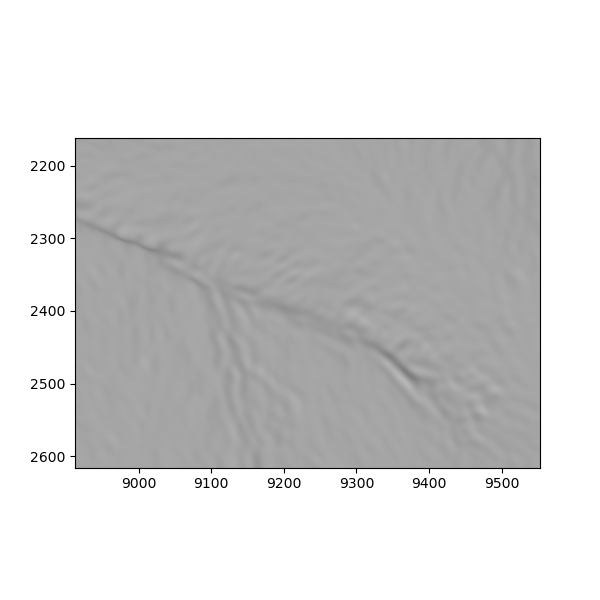

In [25]:
max_curve=0.003

curv_lo = np.ma.masked_where(curv < 0.0, curv)
curv_mask = np.ma.masked_where(curv_lo > max_curve, curv_lo)



fig, ax = plt.subplots(figsize=(6,6))

im0 = ax.imshow(curv, 
#           norm=colors.LogNorm(vmax=0.0007), cmap='Blues', zorder=1)
            cmap='Greys', zorder=1)
im0 = ax.imshow(curv_mask, vmin=0.0, vmax=max_curve, cmap='Blues', zorder=2)
#           norm=colors.LogNorm(vmax=0.0007), cmap='Blues', zorder=1)
            

## Updated figure with LW curvature for more realistic numbers

In [27]:
#Bins for area
a1=10.**(np.arange(1, 7)) 
a2 = np.arange(1,10,1)
bin_edges=np.outer(a1, a2).flatten()

mean_stat_ca = binned_statistic(dinf_arr,curv_arr,
                            statistic='median',
                            bins=bin_edges)

mean_stat_dd = binned_statistic(dinf_arr,disp_arr,
                            statistic='median',
                            bins=bin_edges)

/dartfs-hpc/rc/home/1/f005dv1/.conda/envs/geopandas/lib/python3.9/site-packages/numpy/core/_methods.py:179: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


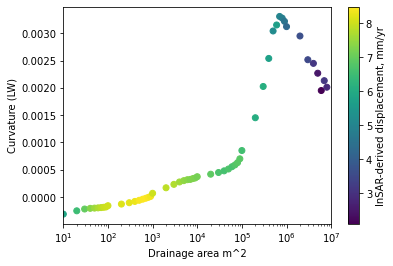

In [36]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(6,4))
im = ax.scatter(mean_stat_ca.bin_edges[:-1],mean_stat_ca.statistic,c=(mean_stat_dd.statistic*1000))

cb = fig.colorbar(im, ax=ax)

cb.set_label('InSAR-derived displacement, mm/yr')

#plt.axhline(0.0, color='k', linestyle='--', alpha=0.3)
plt.xlim((1E1, 1E7))
plt.xlabel('Drainage area m^2')
plt.ylabel('Curvature (LW)')
plt.xscale('log')
#plt.savefig('seward_slopeareadisp.pdf')  
#plt.savefig('seward_slopeareadisp.svg')
plt.show()

# Metrics vs InSAR displacement

In [2]:
displ = rasterio.open('velocity_clip.tif')
darea = rasterio.open('dinf.tif')
curve = rasterio.open('curve.tif')
aspect = rasterio.open('aspect.tif')
slope = rasterio.open('slope.tif')

msk_d = darea.read_masks()
darea_data = darea.read(1, masked=True)
curve_data = curve.read(1, masked=True)
disp_data = displ.read(1, masked=True)
asp_data = aspect.read(1, masked=True)
slope_data = slope.read(1, masked=True)

darea_array=darea_data.flatten()
curve_array=curve_data.flatten()
asp_array=asp_data.flatten()
disp_array=disp_data.flatten()
slope_array=slope_data.flatten()

## View rasters

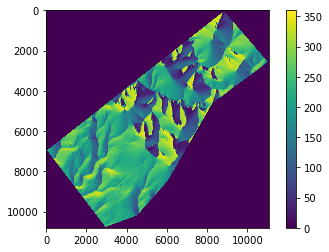

In [6]:
plt.imshow(aspect.read(1), vmin=0, vmax=360)
plt.colorbar()
plt.show()

## do analyses


In [ ]:
northa = (asp_array < 0 + 45) 
northb = (asp_array > 360 - 45) 
north = (asp_array < 0 + 45)  + (asp_array > 360 - 45) 
south = (asp_array > 90+45) & (asp_array < 270-45)
east = (asp_array > 0 + 45) & (asp_array < 90+45)
west = (asp_array < 360-45) & (asp_array > 180+45)


In [ ]:
fig, ax = plt.subplots(4,1,figsize=(5,6),sharex=True)
for i,aspect in enumerate([north, south, east, west]):
    ax[i].hist(slope_array[aspect],bins=50)
    ax[i].set_xlim(0,0.5)
 

In [7]:
#Bins for area
a1=10.**(np.arange(1, 7)) 
a2 = np.arange(1,10,1)
bin_edges=np.outer(a1, a2).flatten()

In [ ]:
labels = ['n','s','e','w']
for i,aspect in enumerate([north, south, east, west]):
    mean_stat = binned_statistic(darea_array[aspect],slope_array[aspect],
                            statistic='median',
                            bins=bin_edges)

    std_stat = binned_statistic(darea_array[aspect],slope_array[aspect],
                            statistic='std',
                            bins=bin_edges)
    plt.scatter(mean_stat.bin_edges[:-1],mean_stat.statistic, label=labels[i])
plt.xscale('log')
plt.xlabel('Drainage area m^2')
plt.ylabel('Slope')
plt.legend()

In [ ]:
for i,aspect in enumerate([north, south, east, west]):
    mean_stat = binned_statistic(darea_array[aspect],curve_array[aspect],
                            statistic='median',
                            bins=bin_edges)

    std_stat = binned_statistic(darea_array[aspect],curve_array[aspect],
                            statistic='std',
                            bins=bin_edges)
    plt.scatter(mean_stat.bin_edges[:-1],mean_stat.statistic, label=labels[i])
plt.xlabel('Drainage area m^2')
plt.ylabel('Curvature')
plt.xscale('log')
plt.legend()

In [ ]:
fig, ax = plt.subplots()
for i,aspect in enumerate([north, south, east, west]):
    mean_stat = binned_statistic(darea_array[aspect],disp_array[aspect],
                            statistic='median',
                            bins=bin_edges)

    std_stat = binned_statistic(darea_array[aspect],disp_array[aspect],
                            statistic='std',
                            bins=bin_edges)
    ax.scatter(mean_stat.bin_edges[:-1],mean_stat.statistic, label=labels[i])
    ax.set_xscale('log')
plt.xlabel('Drainage area m^2')
plt.ylabel('Displacement (m)')
plt.legend()

In [ ]:
mean_stat = binned_statistic(darea_array,disp_array,
                            statistic='median',
                            bins=bin_edges)

std_stat = binned_statistic(darea_array,disp_array,
                            statistic='std',
                            bins=bin_edges)
plt.scatter(mean_stat.bin_edges[:-1],mean_stat.statistic)
#plt.errorbar(mean_stat.bin_edges[1:],mean_stat.statistic,yerr=std_stat.statistic,fmt='o')
plt.xlabel('Drainage area m^2')
plt.ylabel('Displacement (m)')
plt.xscale('log')
plt.show()

In [ ]:
mean_stat = binned_statistic(darea_array,slope_array,
                            statistic='median',
                            bins=bin_edges)

std_stat = binned_statistic(darea_array,slope_array,
                            statistic='std',
                            bins=bin_edges)
plt.scatter(mean_stat.bin_edges[:-1],mean_stat.statistic)
plt.xlabel('Drainage area m^2')
plt.ylabel('Slope')
plt.xscale('log')
plt.show()

In [ ]:
mean_stat = binned_statistic(darea_array,curve_array,
                            statistic='median',
                            bins=bin_edges)

std_stat = binned_statistic(darea_array,curve_array,
                            statistic='std',
                            bins=bin_edges)
plt.scatter(mean_stat.bin_edges[:-1],mean_stat.statistic)
plt.xlabel('Drainage area m^2')
plt.ylabel('Curvature')
plt.xscale('log')
plt.show()

In [ ]:
mean_stat = binned_statistic(darea_array,curve_array,
                            statistic='median',
                            bins=bin_edges)
plt.scatter(mean_stat.bin_edges[:-1],mean_stat.statistic)
plt.xlabel('Drainage area m^2')
plt.ylabel('curvature')
plt.xscale('log')
plt.show()

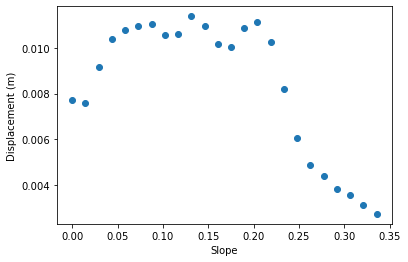

In [110]:
mean_stat = binned_statistic(slope_array,disp_array,
                            statistic='mean',
                            bins=np.linspace(0,0.35,25))
std_stat = binned_statistic(slope_array,disp_array,
                            statistic='std',
                            bins=np.linspace(0,0.35,25))
plt.scatter(mean_stat.bin_edges[:-1],mean_stat.statistic)
#plt.errorbar(mean_stat.bin_edges[1:],mean_stat.statistic,yerr=std_stat.statistic,fmt='o')
plt.xlabel('Slope')
plt.ylabel('Displacement (m)')
plt.show()

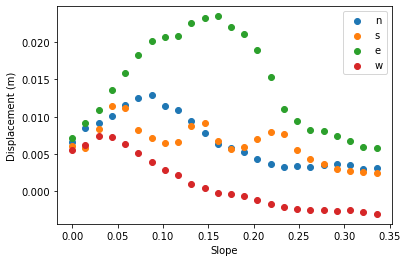

In [25]:
labels = ['n','s','e','w']
fig, ax = plt.subplots()
for i,aspect in enumerate([north, south, east, west]):
    mean_stat = binned_statistic(slope_array[aspect],disp_array[aspect],
                            statistic='median',
                            bins=np.linspace(0,0.35,25))
    ax.scatter(mean_stat.bin_edges[:-1],mean_stat.statistic, label=labels[i])
plt.xlabel('Slope')
plt.ylabel('Displacement (m)')
plt.legend()



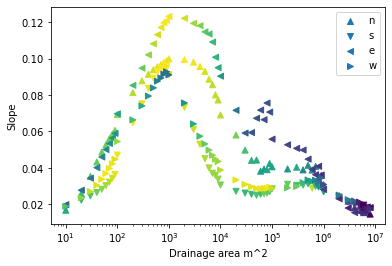

In [22]:
labels = ['n','s','e','w']
for i,aspect in enumerate([north, south, east, west]):
    mean_stat_sa = binned_statistic(darea_array[aspect],slope_array[aspect],
                            statistic='median',
                            bins=bin_edges)

    mean_stat_dd = binned_statistic(darea_array[aspect],disp_array[aspect],
                            statistic='median',
                            bins=bin_edges)
    for i, ax in enumerate(axes[0]):
    plt.scatter(mean_stat_sa.bin_edges[:-1],mean_stat_sa.statistic, label=labels[i], c=mean_stat_dd.statistic)
plt.xscale('log')
plt.xlabel('Drainage area m^2')
plt.ylabel('Slope')
plt.legend()

In [9]:
mean_stat_sa = binned_statistic(darea_array,slope_array,
                            statistic='median',
                            bins=bin_edges)
std_stat_sa = binned_statistic(darea_array,slope_array,
                            statistic='std',
                            bins=bin_edges)
mean_stat_dd = binned_statistic(darea_array,disp_array,
                            statistic='median',
                            bins=bin_edges)


C:\Users\joanm\Anaconda3\lib\site-packages\numpy\core\_methods.py:151: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims)


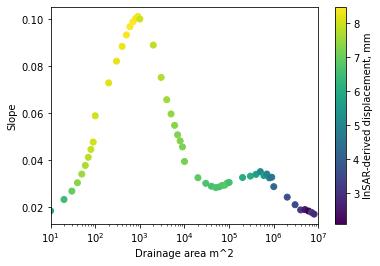

In [17]:
import matplotlib as mpl
fig, ax = plt.subplots(figsize=(6,4))
#im = ax.scatter(mean_stat_sa.bin_edges[:-1],mean_stat_sa.statistic,c=(mean_stat_dd.statistic*1000), vmin=6, vmax=8.5)
im = ax.scatter(mean_stat_sa.bin_edges[:-1],mean_stat_sa.statistic,c=(mean_stat_dd.statistic*1000))

cb = fig.colorbar(im, ax=ax)

cb.set_label('InSAR-derived displacement, mm')
plt.xlim((1E1, 1E7))
plt.xlabel('Drainage area m^2')
plt.ylabel('Slope')
plt.xscale('log')
#plt.savefig('seward_slopeareadisp.pdf')  
#plt.savefig('seward_slopeareadisp.svg')
plt.show()
  

In [18]:
mean_stat_sa = binned_statistic(darea_array[disp_array<0],slope_array[disp_array<0],
                            statistic='median',
                            bins=bin_edges)
std_stat_sa = binned_statistic(darea_array[disp_array<0],slope_array[disp_array<0],
                            statistic='std',
                            bins=bin_edges)
mean_stat_dd = binned_statistic(darea_array[disp_array<0],disp_array[disp_array<0],
                            statistic='median',
                            bins=bin_edges)


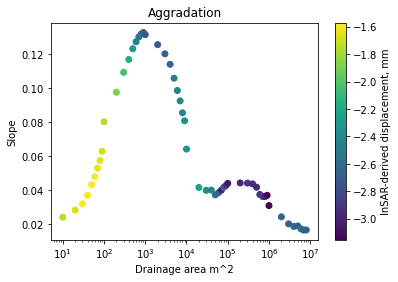

In [20]:
fig, ax = plt.subplots()
im = ax.scatter(mean_stat_sa.bin_edges[:-1],mean_stat_sa.statistic,c=(mean_stat_dd.statistic*1000))

cb = fig.colorbar(im, ax=ax)

cb.set_label('InSAR-derived displacement, mm')
# plt.xlim((1E1, 1E5))
plt.xlabel('Drainage area m^2')
plt.ylabel('Slope')
plt.xscale('log')
plt.title('Aggradation')
# plt.savefig('seward_slopeareadisp_depo.pdf')  
# plt.savefig('seward_slopeareadisp.svg')
plt.show()

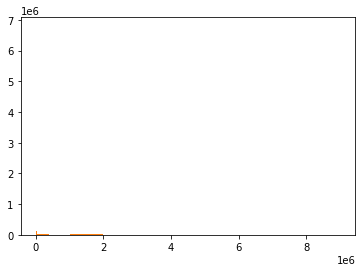

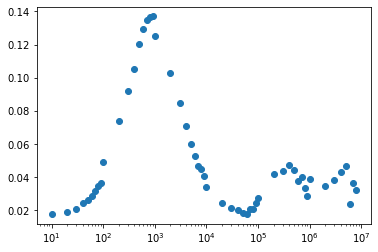

In [115]:
counts_1, edges, plot = plt.hist(darea_array[disp_array>0.025], bins=bin_edges);
counts_2, edges, plot = plt.hist(darea_array, bins=bin_edges);
fig, ax = plt.subplots()
ratio = counts_1/counts_2
im = ax.scatter(bin_edges[:-1], ratio)
plt.xscale('log')
plt.show()

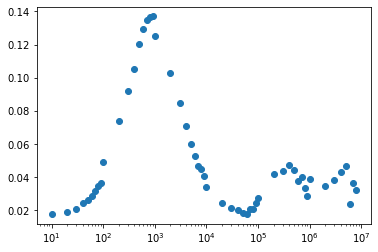

In [114]:
fig, ax = plt.subplots()
ratio = counts_1/counts_2
im = ax.scatter(bin_edges[:-1], ratio)
plt.xscale('log')
plt.show()

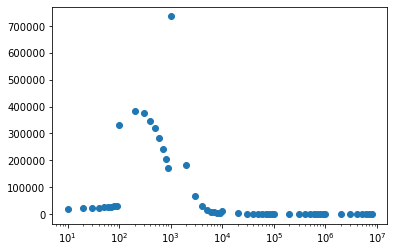

In [116]:
fig, ax = plt.subplots()
ratio = counts_1/counts_2
im = ax.scatter(bin_edges[:-1], counts_1)
plt.xscale('log')
plt.show()

In [ ]:
plt.scatter((((darea_array**0.5) * slope_array)-1), curve_array, c=disp_array, alpha=.5)
